<a href="https://colab.research.google.com/github/aruaru0/HuBmap/blob/main/SUB5_0_72_b5_train_segformer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SegFormer Train

In [1]:
!nvidia-smi

Thu Sep  1 13:16:06 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    30W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
%%capture
!pip install wandb --upgrade

In [4]:
!cp /content/drive/MyDrive/Kaggle/netrc ~/.netrc

In [3]:
import wandb
wandb.login()

wandb: Currently logged in as: aruaru0. Use `wandb login --relogin` to force relogin


True

## kaggle

In [5]:
!mkdir -p ~/.kaggle
!cp /content/drive/MyDrive/datas/kaggle.json  ~/.kaggle/

In [6]:
!chmod 600 /root/.kaggle/kaggle.json

In [7]:
!kaggle competitions download -c hubmap-organ-segmentation

100% 5.77G/5.78G [00:44<00:00, 227MB/s]
100% 5.78G/5.78G [00:44<00:00, 139MB/s]


In [8]:
# !mkdir hubmap
!unzip /content/hubmap-organ-segmentation.zip -d hubmap >/dev/null

In [9]:
!pip install pytorch-lightning
!pip install transformers datasets

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 706 kB 4.9 MB/s 
     |████████████████████████████████| 5.9 MB 59.7 MB/s 
     |████████████████████████████████| 419 kB 62.5 MB/s 
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.8.0
    Uninstalling tensorboard-2.8.0:
      Successfully uninstalled tensorboard-2.8.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.8.2+zzzcolab20220719082949 requires tensorboard<2.9,>=2.8, but you have tensorboard 2.10.0 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 4.7 MB 5.2 MB/s 
     |████████████████████████████████| 365 kB 67.1 MB/s 
     |████████████████████████████████| 

In [10]:
!pip install staintools
!pip install spams

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for staintools: filename=staintools-2.1.2-py3-none-any.whl size=14075 sha256=5524b6f03b55ab5a17b0c0f730124d97eaced635216d079cc15ce6265d53b7ee
  Stored in directory: /root/.cache/pip/wheels/9b/ed/74/9d36d40854e911d8e2d2d28d7b67e37e9f176f913ecf34f813
Successfully built staintools
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.0 MB 6.6 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for spams: filename=spams-2.6.5.4-cp37-cp37m-linux_x86_64.whl size=3236641 sha256=038cf50150d7a80b7d50b32b5237272493c4f5dc6086db311683287cc3365680
  Stored in directory: /root/.cache/pip/wheels/5e/92/17/e718e0e26bfcdd7e81afcf874ac2bc599dd7dd7f3ad78f9d76
Successfully built spams


In [ ]:
# from google.colab import output
# output.enable_custom_widget_manager()

## Start code

In [11]:
import wandb
wandb.init(project="HuBMAP-SegFormer")

In [12]:
%load_ext tensorboard

In [13]:
from google.colab import output
output.enable_custom_widget_manager()

In [ ]:
from torch.utils.tensorboard import SummaryWriter

In [ ]:
from typing import Optional, List

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim.lr_scheduler import ConstantLR, LinearLR
from torch.utils.data import DataLoader
from torch.utils.data import Dataset as BaseDataset
import torchvision.transforms as transforms
import pytorch_lightning as pl
from pytorch_lightning.callbacks import LearningRateMonitor, ModelCheckpoint

# from timm import create_model

import numpy as np
import cv2
import matplotlib.pyplot as plt

import os
import albumentations as albu
import random

import pandas as pd

from tqdm.notebook import tqdm

from sklearn.model_selection import KFold

In [ ]:
#https://www.kaggle.com/code/pestipeti/decoding-rle-masks/notebook
def mask2rle(img):
    '''
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    '''
    pixels= img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)


def rle2mask(mask_rle, shape=(3000,3000)):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (width,height) of array to return 
    Returns numpy array, 1 - mask, 0 - background

    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0::2], s[1::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T

##  load test data

In [ ]:
SEED = 43
BATCH_SIZE = 4
Gradient_Accumulation_Step = 7

In [ ]:
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    #the following line gives ~10% speedup
    #but may lead to some stochasticity in the results 
    torch.backends.cudnn.benchmark = True
    
seed_everything(SEED)

In [ ]:
DATA_DIR = './hubmap'
NFOLD = 5
FOLD = 4

WIDTH, HEIGHT = 512,512

model_path = '/content/drive/MyDrive/datas/HuBMAP/model-b5-fold{}.pth'.format(FOLD)
MODEL_NAME = "nvidia/mit-b5"
# MODEL_NAME = "nvidia/segformer-b3-finetuned-ade-512-512"

wandb.SEED = SEED
wandb.config.NFOLD = NFOLD
wandb.config.FOLD = FOLD
wandb.config.WIDTH = WIDTH
wandb.config.HEIGHT= HEIGHT
wandb.config.MODEL_NAME = MODEL_NAME

#
# nvidia/segformer-b0-finetuned-ade-512-512
# nvidia/segformer-b1-finetuned-ade-512-512
# nvidia/segformer-b2-finetuned-ade-512-512
# nvidia/segformer-b3-finetuned-ade-512-512
# nvidia/segformer-b4-finetuned-ade-512-512
# nvidia/segformer-b5-finetuned-ade-640-640
# https://huggingface.co/models?other=segformer&sort=downloads&search=nvidia%2Fsegformer+finetuned
#
df = pd.read_csv(DATA_DIR + '/train.csv')

In [ ]:
# df = df[df['organ']=='lung'].reset_index()
df

In [ ]:
# class2idx = dict([(name,i+1) for i, name in enumerate(df.organ.unique())])
# class2idx['none'] = 0
# idx2class = dict([(class2idx[name], name) for name in class2idx])

class2idx = {'prostate': 1,
  'spleen': 2,
  'lung': 3,
  'kidney': 4,
  'largeintestine': 5,
  'none': 0}
idx2class = {1: 'prostate',
  2: 'spleen',
  3: 'lung',
  4: 'kidney',
  5: 'largeintestine',
  0: 'none'}

class2idx, idx2class

In [ ]:
idx = 0
height, width, rle = df['img_height'][idx], df['img_width'][idx], df['rle'][idx]
mask = rle2mask(rle, shape=(height, width))
plt.imshow(mask)

In [ ]:
from sklearn.model_selection import StratifiedKFold

df['fold'] = 0

skf = StratifiedKFold(n_splits=5)
for i, index in enumerate(skf.split(df.id, df.organ)):
  train_index, test_index = index
  # print("train_index:", train_index, "test_index:", test_index)
  # df['fold'][test_index] = i
  df.loc[test_index, 'fold'] = i

df

## Utils

### augumentation

In [ ]:
import staintools

In [ ]:
class Stain(albu.ImageOnlyTransform):
    def __init__(
        self,
        method='vahadane', sigma1=0.2, sigma2=0.2,
        always_apply=False,
        p=0.5,
    ):
        super(Stain, self).__init__(always_apply, p)
        self.method = method
        self.sigma1 = sigma1
        self.sigma2 = sigma2
        self.augmentor = staintools.StainAugmentor(method=method, sigma1=sigma1, sigma2=sigma2)

    def apply(self, img, **params):
        self.augmentor.fit(img)
        return self.augmentor.pop().astype(int)

    def get_params(self):
        return {
        }

    def get_transform_init_args_names(self):
        return ("brightness_limit", "contrast_limit", "brightness_by_max")

In [ ]:
# ----- set0
def get_training_augmentation_set0(p=0.5):
    return albu.Compose([
        albu.Sequential([
          albu.RandomScale(scale_limit=(-0.8, 0.0), interpolation=cv2.INTER_LINEAR, p=1),
          albu.Resize(HEIGHT, WIDTH, interpolation=cv2.INTER_LINEAR, p=1)
        ], p=p),
        albu.HorizontalFlip(p=p),
        albu.VerticalFlip(p=p),
        albu.RandomRotate90(p=p),
        albu.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=15, p=p, 
                         border_mode=cv2.BORDER_REFLECT),
        # albu.OneOf([
        #     albu.OpticalDistortion(p=1),
        #     albu.GridDistortion(p=1),
        #     albu.IAAPiecewiseAffine(p=1),
        # ], p=p),
        albu.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=p),
        albu.OneOf([
            albu.CLAHE(clip_limit=2, p = 1),
            albu.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.2, p=1),
            albu.HueSaturationValue (hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=1),
        ], p=p),
        albu.GaussNoise(var_limit=(10.0, 50.0), p=p),
    ], p=p)
# ---- set1
def get_training_augmentation_set1(p=0.5):
    return albu.Compose([
        albu.Sequential([
          albu.RandomScale(scale_limit=(-0.8, 0.0), interpolation=cv2.INTER_LINEAR, p=1),
          albu.Resize(HEIGHT, WIDTH, interpolation=cv2.INTER_LINEAR, p=1)
        ], p=p),
        albu.HorizontalFlip(p=p),
        albu.VerticalFlip(p=p),
        albu.RandomRotate90(p=p),
        # albu.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=15, p=p, 
        #                  border_mode=cv2.BORDER_REFLECT),
        albu.ShiftScaleRotate(shift_limit=0.2, scale_limit=0.2, rotate_limit=15, p=p, 
                         border_mode=cv2.BORDER_REFLECT),
        # albu.OneOf([
        #     albu.OpticalDistortion(p=1),
        #     albu.GridDistortion(p=1),
        #     albu.IAAPiecewiseAffine(p=1),
        # ], p=p),
        albu.ChannelShuffle(p=p),
        albu.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=p),
        albu.OneOf([
            albu.CLAHE(clip_limit=2, p = 1),
            albu.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.2, p=1),
            albu.HueSaturationValue (hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=1),
        ], p=p),
        albu.GaussNoise(var_limit=(10.0, 50.0), p=p),
    ], p=p)


In [ ]:
def get_training_augmentation3(p=0.5):
    return albu.Compose([
        albu.Sequential([
          albu.RandomScale(scale_limit=(-0.8, 0.0), interpolation=cv2.INTER_LINEAR, p=1),
          albu.Resize(HEIGHT, WIDTH, interpolation=cv2.INTER_LINEAR, p=1)
        ], p=p),
        albu.HorizontalFlip(p=p),
        albu.VerticalFlip(p=p),
        albu.RandomRotate90(p=p),
        albu.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=15, p=p, 
                         border_mode=cv2.BORDER_REFLECT),
        # albu.OneOf([
        #     albu.OpticalDistortion(p=1),
        #     albu.GridDistortion(p=1),
        #     albu.IAAPiecewiseAffine(p=1),
        # ], p=p),
        albu.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=p),
        albu.OneOf([
            # albu.CLAHE(clip_limit=2, p = 1),
            albu.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.2, p=1),
            albu.HueSaturationValue (hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=1),
        ], p=p),
        albu.GaussNoise(var_limit=(10.0, 50.0), p=p),
        # albu.CoarseDropout (max_holes=50, max_height=16, max_width=16, p=p)
    ], p=p)

# def get_training_augmentation3(p=0.5):
#     return albu.Compose([
#         albu.Sequential([
#           albu.RandomScale(scale_limit=(-0.8, 0.0), interpolation=cv2.INTER_LINEAR, p=1),
#           albu.Resize(HEIGHT, WIDTH, interpolation=cv2.INTER_LINEAR, p=1)
#         ], p=p),
#         albu.HorizontalFlip(p=p),
#         albu.VerticalFlip(p=p),
#         albu.RandomRotate90(p=p),
#         albu.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=15, p=p, 
#                          border_mode=cv2.BORDER_REFLECT),
#         # albu.ShiftScaleRotate(shift_limit=0.2, scale_limit=0.2, rotate_limit=15, p=p, 
#         #                  border_mode=cv2.BORDER_REFLECT),
#         # albu.OneOf([
#         #     albu.OpticalDistortion(p=1),
#         #     albu.GridDistortion(p=1),
#         #     albu.IAAPiecewiseAffine(p=1),
#         # ], p=p),
#         albu.OneOf([
#             albu.ChannelShuffle(p=1),
#             albu.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=1),
#             albu.CLAHE(clip_limit=2, p = 1),
#             albu.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.2, p=1),
#             albu.HueSaturationValue (hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=1),
#         ], p=p),
#         albu.GaussNoise(var_limit=(10.0, 50.0), p=p),
#         albu.CoarseDropout (max_holes=50, max_height=16, max_width=16, p=p)
#     ], p=p)


In [ ]:
def get_training_augmentation2(p=1.0):
    return albu.Compose([
        albu.HorizontalFlip(),
        albu.VerticalFlip(),
        albu.RandomRotate90(),
        albu.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=15, p=0.9, 
                         border_mode=cv2.BORDER_REFLECT),
        albu.OneOf([
            albu.OpticalDistortion(p=0.3),
            albu.GridDistortion(p=.1),
            albu.IAAPiecewiseAffine(p=0.3),
        ], p=0.3),
        albu.OneOf([
            # albu.HueSaturationValue(10,15,10),
            albu.CLAHE(clip_limit=2),
            albu.RandomBrightnessContrast(),            
        ], p=0.3),
        albu.GaussNoise(var_limit=(10.0, 50.0), p=0.3)
    ], p=p)

def get_training_augmentation():
    train_transform = [
        albu.PadIfNeeded(min_height=HEIGHT, min_width=WIDTH, always_apply=True, border_mode=0),
        albu.RandomCrop(height=HEIGHT, width=WIDTH, always_apply=True),
    ]
    return albu.Compose(train_transform)


def get_grayaug():
    train_transform = [
        albu.ToGray(p=1.0),
    ]
    return albu.Compose(train_transform)

# def get_validation_augmentation():
#     """画像のshapeが32で割り切れるようにPaddingするための関数"""
#     test_transform = [
#         albu.PadIfNeeded(384, 480)
#     ]
#     return albu.Compose(test_transform)

def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')

def get_preprocessing(preprocessing_fn):
    """Construct preprocessing transform    
    Args:
        preprocessing_fn (callbale): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose    
    """
    
    _transform = [
        albu.Lambda(image=preprocessing_fn),
        albu.Lambda(image=to_tensor, mask=to_tensor),
    ]
    return albu.Compose(_transform)

# 可視化用の関数
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()

## dataset

In [ ]:
from transformers import SegformerFeatureExtractor

mean = np.array([0.7720342, 0.74582646, 0.76392896])
std = np.array([0.24745085, 0.26182273, 0.25782376])

def img2tensor(img,dtype:np.dtype=np.float32):
    if img.ndim==2 : img = np.expand_dims(img,2)
    img = np.transpose(img,(2,0,1))
    return torch.from_numpy(img.astype(dtype, copy=False))


# 1. torch.utils.data.Datasetを継承したDataset classを定義
class Dataset(torch.utils.data.Dataset):
    # CLASSES = ['sky', 'building', 'pole', 'road', 'pavement', 
    #            'tree', 'signsymbol', 'fence', 'car', 
    #            'pedestrian', 'bicyclist', 'unlabelled']
    
    def __init__(
            self,
            image_dir, 
            df, # ファイル名一覧
            # classes=None, # 推論対象のクラス
            augmentation=None, # augmentation用関数
            preprocessing=None, # 前処理用関数
            width = 768,
            height = 768,
    ):
        self.image_dir = image_dir
        self.df = df
        self.augmentation = augmentation
        self.preprocessing = preprocessing
        self.width = width
        self.height = height
        self.feature_extractor = SegformerFeatureExtractor(MODEL_NAME , reduce_labels=False, size=(width, height))
    
    # 3. 学習用データ(image)と特徴(mask)を返す__getitem__メソッドを作成
    def __getitem__(self, i):
        # データの読み込み
        fname = "{}/{}.tiff".format(self.image_dir,self.df['id'][i])
        # print(fname)
        image = cv2.imread(fname)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        rle, w, h = self.df['rle'][i], self.df['img_width'][i], self.df['img_height'][i]
        idx = class2idx[self.df['organ'][i]]
        mask = rle2mask(rle, shape = (w, h))
        # print(self.df['organ'][i], idx)

        image = cv2.resize(image, (self.width, self.height))
        mask = cv2.resize(mask, (self.width, self.height)) * idx

        # augmentation関数の適用
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
        
        # print("image", image.shape)
        # # return image, mask
        # image = (image/255 - mean)/std
        
        # return img2tensor(image),torch.tensor(mask), idx
        # return image, mask
        encoded_inputs = self.feature_extractor(image, mask, return_tensors="pt")

        for k,v in encoded_inputs.items():
          encoded_inputs[k].squeeze_() # remove batch dimension

        return encoded_inputs

    # 4. データセットの長さを返す__len__を作成
    def __len__(self):
        return len(self.df)

torch.Size([3, 512, 512])


tensor([0, 1])

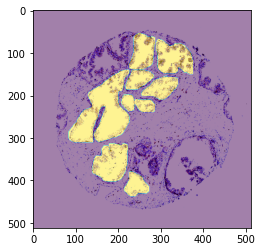

In [ ]:
IMAGE_DIR = './hubmap/train_images'
train_dataset = Dataset(IMAGE_DIR, df[df['fold'] != FOLD].reset_index(), width=WIDTH, height=HEIGHT)
input = train_dataset[0]
print(input['pixel_values'].shape)
plt.imshow(input['pixel_values'].permute(1,2,0).numpy())
plt.imshow(input['labels'], alpha=0.5)
input['labels'].unique()

In [ ]:
input

{'pixel_values': tensor([[[2.0777, 2.0777, 2.0605,  ..., 2.0777, 2.0777, 2.0777],
         [2.0777, 2.0777, 2.0777,  ..., 2.0777, 2.0777, 2.0777],
         [2.0263, 2.0777, 2.0777,  ..., 2.0777, 2.0777, 2.0777],
         ...,
         [2.0605, 2.0777, 2.0434,  ..., 2.0777, 2.0777, 2.0777],
         [2.0777, 2.0777, 2.0777,  ..., 2.0434, 2.0777, 2.0777],
         [2.0777, 2.0777, 2.0605,  ..., 2.0777, 2.0605, 2.0777]],

        [[2.2360, 2.2535, 2.2185,  ..., 2.2535, 2.2535, 2.2535],
         [2.2360, 2.2360, 2.2535,  ..., 2.2535, 2.2535, 2.2535],
         [2.2010, 2.2185, 2.2535,  ..., 2.2535, 2.2360, 2.2535],
         ...,
         [2.2535, 2.2360, 2.2360,  ..., 2.2535, 2.2535, 2.2535],
         [2.2535, 2.2360, 2.2535,  ..., 2.2535, 2.2360, 2.2535],
         [2.2360, 2.2535, 2.2360,  ..., 2.2360, 2.2360, 2.2535]],

        [[2.4657, 2.4657, 2.4483,  ..., 2.4657, 2.4657, 2.4657],
         [2.4657, 2.4657, 2.4657,  ..., 2.4657, 2.4483, 2.4657],
         [2.3786, 2.3960, 2.4483,  ..., 2

280


0 torch.Size([3, 512, 512])


0 torch.Size([3, 512, 512])


0 torch.Size([3, 512, 512])


0 torch.Size([3, 512, 512])


0 torch.Size([3, 512, 512])


0 torch.Size([3, 512, 512])


0 torch.Size([3, 512, 512])


0 torch.Size([3, 512, 512])


0 torch.Size([3, 512, 512])


0 torch.Size([3, 512, 512])


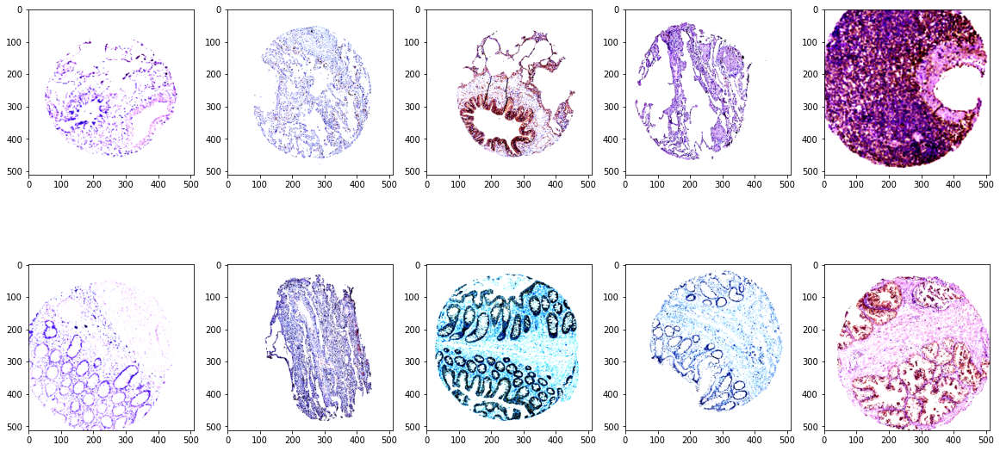

In [ ]:
# # # データセットのインスタンスを作成
train_dataset = Dataset(IMAGE_DIR, df[df['fold'] != 0].reset_index(), 
                        width=WIDTH, height=HEIGHT,
                        augmentation=get_training_augmentation3(), 
                        )

plt.figure(figsize=(20, 10))

print(train_dataset.__len__())
for i in range(10) :
  input = train_dataset[i]
  print(idx, input.pixel_values.shape)
  plt.subplot(2, 5, i+1);
  plt.imshow(input['pixel_values'].permute(1,2,0).numpy())
  # plt.imshow(input['labels'], alpha=0.5)
plt.show()

In [ ]:
from torch.utils.data import DataLoader
# CLASSES = ['car']


# データセットのインスタンスを作成
# train_dataset = Dataset(IMAGE_DIR, df[df['fold'] != FOLD].reset_index(), 
#                         width=WIDTH, height=HEIGHT,
#                         augmentation=get_training_augmentation3(p=0.9), 
#                         )
train_dataset = Dataset(IMAGE_DIR, df.reset_index(), 
                        width=WIDTH, height=HEIGHT,
                        augmentation=get_training_augmentation3(p=0.9), 
                        )

valid_dataset = Dataset(
    IMAGE_DIR, df[df['fold'] == FOLD].reset_index(), 
    width=WIDTH, height=HEIGHT,
    augmentation=None, 
)

# データローダーの作成
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
valid_loader = DataLoader(valid_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

0


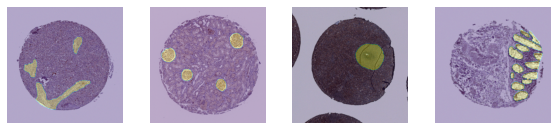

In [ ]:
row, col = 8, 8
plt.figure(figsize=(20,20))

for inputs in train_loader:
  print(idx)
  data = inputs['pixel_values']
  mask = inputs['labels']
  for i in range(BATCH_SIZE) :
    plt.subplot(col, row, i+1)
    x = data[i].permute(1,2,0)
    plt.imshow((x-x.min())/(x.max()-x.min()))
    plt.imshow(mask[i], alpha=0.3)
    plt.axis('off')
  # print(data.shape)
  break

## ここまで前処理

In [30]:
from transformers import SegformerForSemanticSegmentation
# define model
model = SegformerForSemanticSegmentation.from_pretrained(MODEL_NAME,
                                                         num_labels=len(class2idx), 
                                                         id2label=idx2class, 
                                                         label2id=class2idx,
                                                         ignore_mismatched_sizes=True,
)

Some weights of the model checkpoint at nvidia/mit-b5 were not used when initializing SegformerForSemanticSegmentation: ['classifier.bias', 'classifier.weight']
- This IS expected if you are initializing SegformerForSemanticSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing SegformerForSemanticSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b5 and are newly initialized: ['decode_head.batch_norm.weight', 'decode_head.linear_c.3.proj.weight', 'decode_head.classifier.weight', 'decode_head.linear_c.2.proj.weight', 'decode_head.linear_c.1.proj.weight', 'decode_head.classi

In [31]:
# # model_path = '/content/drive/MyDrive/datas/HuBMAP/model.pth'
# model_path_last = '/content/drive/MyDrive/datas/HuBMAP/last-fold{}.pth'.format(FOLD)
# model.load_state_dict(torch.load(model_path_last))

<All keys matched successfully>

In [32]:
from datasets import load_metric

metric = load_metric("mean_iou")

In [61]:
test_df = df[df['fold'] == FOLD].reset_index()

def dice_coef(mask1, mask2):
    intersect = np.sum(mask1*mask2)
    sum1 = np.sum(mask1)
    sum2 = np.sum(mask2)
    dice = 2*intersect/(sum1+sum2)
    dice = np.mean(dice)
    return dice

def valid(model2) :
  model2.eval()
  dice = 0.0
  loss = 0.0
  for i in tqdm(range(len(test_df))) :
    id = test_df.id[i]
    fname = "/content/hubmap/train_images/{}.tiff".format(id)
    image = Image.open(fname)
    encoding = feature_extractor(image, return_tensors="pt")
    pixel_values = encoding.pixel_values.cuda()

    # print(pixel_values.shape)

    organ = test_df.organ[i]
    idx = class2idx[organ]

    rle = test_df.rle[i]
    height, width = test_df.img_height[i], test_df.img_width[i]
    gt = rle2mask(rle, shape = (height, width))
    gt2 = cv2.resize(gt, pixel_values.shape[-2:]) * idx

    label = torch.tensor(gt2).unsqueeze(0).long().cuda()

    # print(label.shape)

    with torch.no_grad():
      outputs = model2(pixel_values=pixel_values, labels=label)
      loss += outputs.loss.item()
      # print(outputs.loss, loss)
      upsampled_logits = nn.functional.interpolate(outputs['logits'],
                  # size=image.size[::-1], # (height, width)
                  (height, width),
                  mode='bilinear',
                  align_corners=False)
      mask = upsampled_logits.argmax(dim=1)[0]
      mask[mask != idx] = 0
      mask[mask == idx] = 1


    dice += dice_coef(mask.cpu().numpy(), gt)
  return dice/len(test_df), loss/len(test_df)

In [62]:
# import torch
# from torch import nn
# from sklearn.metrics import accuracy_score
# # from tqdm.notebook import tqdm
# # from tqdm import tqdm
# from fastprogress.fastprogress import  progress_bar as tqdm

# from PIL import Image
# from transformers import SegformerFeatureExtractor

# feature_extractor = SegformerFeatureExtractor(reduce_labels=False, size=(WIDTH, HEIGHT))
# model = model.cuda()
# valid(model)

(0.9210504537418504, 0.0234032034208732)

## TRAIN


In [ ]:
import torch
from torch import nn
from sklearn.metrics import accuracy_score
# from tqdm.notebook import tqdm
# from tqdm import tqdm
from fastprogress.fastprogress import  progress_bar as tqdm

from PIL import Image
from transformers import SegformerFeatureExtractor

writer = SummaryWriter(log_dir="./logs")
feature_extractor = SegformerFeatureExtractor(reduce_labels=False, size=(WIDTH, HEIGHT))
use_amp = True # ampをオンオフ


# define optimizer
# optimizer = torch.optim.AdamW(model.parameters(), lr=0.00006)
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4,  weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size = 100, gamma=0.75)

# move model to GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

scaler = torch.cuda.amp.GradScaler(enabled=use_amp)

# scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer, 
#                                               base_lr=1e-5,
#                                               max_lr=1e-3,
#                                               step_size_up=7,
#                                               step_size_down=13,
#                                               mode="triangular",
#                                               cycle_momentum=False,
#                                               gamma=0.95)


model.train()
cur_loss = 0
best_epoch = 0
for epoch in range(300):  # loop over the dataset multiple times
   print("Epoch:", epoch)
   
   model.train()
   optimizer.zero_grad()

   tot_loss = 0.0
   for idx, batch in enumerate(tqdm(train_loader)):
        # get the inputs;
        pixel_values = batch["pixel_values"].to(device)
        labels = batch["labels"].to(device)

        # print(pixel_values.shape, labels.shape)

        # zero the parameter gradients
        with torch.cuda.amp.autocast(enabled=use_amp):
            # forward + backward + optimize
            outputs = model(pixel_values=pixel_values, labels=labels)
            loss, logits = outputs.loss, outputs.logits

        tot_loss += loss.detach().cpu().numpy()
        
        scaler.scale(loss).backward()

        if (idx + 1) % Gradient_Accumulation_Step == 0 or idx == len(train_loader) :
            # optimizer.step()
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()

   scheduler.step()

   print("Loss:", tot_loss/len(train_loader))

   print("valid...")
   dice,valid_loss = valid(model)

   writer.add_scalars("loss", {
       "train": tot_loss/len(train_loader),
       "valid": valid_loss,
       }, epoch+1)  
   writer.add_scalar("lr", scheduler.get_last_lr()[0], epoch+1)
   
   wandb.log({'epoch': epoch, 'train_loss': tot_loss/len(train_loader), "valid_loss": valid_loss, 
              "dice": dice, "lr":scheduler.get_last_lr()[0], "best dice": cur_loss, "best epoch": best_epoch})
   if dice > cur_loss :
     cur_loss = dice
     best_epoch = epoch
     print("update best dice = ", dice, "loss = ", valid_loss)
     torch.save(model.state_dict(), model_path)
   else :
     print("epoch dice = ", dice, "loss = ", valid_loss)


writer.close()
wandb.save(model_path)


Epoch: 0


Loss: 1.5411152467131615
valid...


update best dice =  0.43701099866029325 loss =  0.9734826769147601
Epoch: 1


Loss: 0.7877761027352377
valid...


update best dice =  0.5580028975924618 loss =  0.5854718255145209
Epoch: 2


Loss: 0.46895677223801613
valid...


update best dice =  0.6092782355492796 loss =  0.5237490830676896
Epoch: 3


Loss: 0.35794281908734277
valid...


update best dice =  0.6317830345485849 loss =  0.4821144012468202
Epoch: 4


Loss: 0.27808786962519993
valid...


update best dice =  0.6505040025823694 loss =  0.39811730257102423
Epoch: 5


Loss: 0.24139221368188207
valid...


update best dice =  0.6764778494360123 loss =  0.40931597564901623
Epoch: 6


Loss: 0.20955807021395725
valid...


update best dice =  0.6773518512000012 loss =  0.43657927651490486
Epoch: 7


Loss: 0.19360314165665346
valid...


epoch dice =  0.6763273686080064 loss =  0.45004573251519886
Epoch: 8


Loss: 0.17337353654544463
valid...


update best dice =  0.6919572446863368 loss =  0.3827093135565519
Epoch: 9


Loss: 0.16521947263655337
valid...


update best dice =  0.7067396523984093 loss =  0.4008247851261071
Epoch: 10


Loss: 0.15216728757050904
valid...


epoch dice =  0.6999158978784296 loss =  0.39937208874949387
Epoch: 11


Loss: 0.147395401769741
valid...


epoch dice =  0.696167094678548 loss =  0.4499535110912153
Epoch: 12


Loss: 0.13833984355865556
valid...


update best dice =  0.7086424226235576 loss =  0.41592737058443685
Epoch: 13


Loss: 0.13366624293848872
valid...


update best dice =  0.7144151190564549 loss =  0.38858392254582474
Epoch: 14


Loss: 0.13045332085510547
valid...


update best dice =  0.7146774834324054 loss =  0.4103752211268459
Epoch: 15


Loss: 0.12378784819421443
valid...


epoch dice =  0.6984978362253216 loss =  0.4510299980108227
Epoch: 16


Loss: 0.1212287750095129
valid...


update best dice =  0.7191925456741181 loss =  0.4481121966881411
Epoch: 17


Loss: 0.11293825828893618
valid...


update best dice =  0.7280198775764103 loss =  0.41482728852757383
Epoch: 18


Loss: 0.10945687811313705
valid...


update best dice =  0.7325723719985009 loss =  0.43070774812783513
Epoch: 19


Loss: 0.11082433286884968
valid...


epoch dice =  0.7317125692750477 loss =  0.42096060221748693
Epoch: 20


Loss: 0.10628502373583615
valid...


update best dice =  0.7485048363962848 loss =  0.43205511761563165
Epoch: 21


Loss: 0.10669328780336813
valid...


epoch dice =  0.7074780009364169 loss =  0.4654516658080476
Epoch: 22


Loss: 0.11089151831005108
valid...


epoch dice =  0.7341489340313488 loss =  0.4368086705782584
Epoch: 23


Loss: 0.10647534651004455
valid...


epoch dice =  0.7351076974405545 loss =  0.45807941343103137
Epoch: 24


Loss: 0.1006603871726177
valid...


update best dice =  0.7617141777989027 loss =  0.446370532097561
Epoch: 25


Loss: 0.10040797517550262
valid...


epoch dice =  0.755479672968088 loss =  0.4522011811179774
Epoch: 26


Loss: 0.09486532185904005
valid...


epoch dice =  0.7376658821926056 loss =  0.4784788029002292
Epoch: 27


Loss: 0.09264721217649904
valid...


update best dice =  0.7629055559983758 loss =  0.46584246451301237
Epoch: 28


Loss: 0.09008068858053196
valid...


update best dice =  0.7678642477931367 loss =  0.4806012109188097
Epoch: 29


Loss: 0.09013467182574625
valid...


update best dice =  0.77200326608764 loss =  0.4360673953912088
Epoch: 30


Loss: 0.0932225515557961
valid...


epoch dice =  0.7587591021178728 loss =  0.4544684378430247
Epoch: 31


Loss: 0.09177934596399692
valid...


epoch dice =  0.7561957834024202 loss =  0.4718173970335296
Epoch: 32


Loss: 0.09045813518406992
valid...


epoch dice =  0.759870961006766 loss =  0.5216579142691834
Epoch: 33


Loss: 0.08344384723088959
valid...


update best dice =  0.7804149156709905 loss =  0.4587277709373406
Epoch: 34


Loss: 0.08086455276828598
valid...


epoch dice =  0.7776687218347794 loss =  0.46940887325576375
Epoch: 35


Loss: 0.08491408014246686
valid...


update best dice =  0.7836604351984389 loss =  0.4576773073524237
Epoch: 36


Loss: 0.09040444280782883
valid...


epoch dice =  0.770709900622622 loss =  0.4879661805129477
Epoch: 37


Loss: 0.0827907808971676
valid...


epoch dice =  0.7834674778217088 loss =  0.46740946288087537
Epoch: 38


Loss: 0.07840436447242444
valid...


update best dice =  0.7905191317788182 loss =  0.4179666332900524
Epoch: 39


Loss: 0.07779860678552226
valid...


update best dice =  0.7907737602532997 loss =  0.46349612061998674
Epoch: 40


Loss: 0.07448767320337621
valid...


update best dice =  0.7942538080541691 loss =  0.4895921868671264
Epoch: 41


Loss: 0.07691050033000382
valid...


epoch dice =  0.7811764866280853 loss =  0.5005208381584713
Epoch: 42


Loss: 0.0771590532226996
valid...


update best dice =  0.8008657205226682 loss =  0.5172811377527459
Epoch: 43


Loss: 0.07465153445743701
valid...


epoch dice =  0.796807762733564 loss =  0.48774304520338774
Epoch: 44


Loss: 0.07341177520257505
valid...


update best dice =  0.806206391249676 loss =  0.48670580512178796
Epoch: 45


Loss: 0.0777344446290623
valid...


update best dice =  0.8069746919050693 loss =  0.5027119170076081
Epoch: 46


Loss: 0.0726868967229331
valid...


update best dice =  0.810731506129705 loss =  0.4937047511738326
Epoch: 47


Loss: 0.0734863459894603
valid...


epoch dice =  0.8016638098282503 loss =  0.4782065983994731
Epoch: 48


Loss: 0.07017832692839544
valid...


epoch dice =  0.8001022465760218 loss =  0.481109662300774
Epoch: 49


Loss: 0.07299587361260572
valid...


update best dice =  0.8123383387103528 loss =  0.5240445769525
Epoch: 50


Loss: 0.07169619014232674
valid...


epoch dice =  0.8001455090081219 loss =  0.49707771120592953
Epoch: 51


Loss: 0.07160546016794714
valid...


epoch dice =  0.8001098527244314 loss =  0.550837432433452
Epoch: 52


Loss: 0.07535728107375855
valid...


epoch dice =  0.8067363865192742 loss =  0.5195268418373806
Epoch: 53


Loss: 0.07124434413642368
valid...


update best dice =  0.8207108977551533 loss =  0.5080429616783346
Epoch: 54


Loss: 0.07256076379086483
valid...


epoch dice =  0.813270140100031 loss =  0.4992400330225272
Epoch: 55


Loss: 0.06643912540113722
valid...


update best dice =  0.8275337505300562 loss =  0.5235300364238875
Epoch: 56


Loss: 0.06998454256575894
valid...


update best dice =  0.8316661302379097 loss =  0.5028272339275905
Epoch: 57


Loss: 0.06537409222007474
valid...


epoch dice =  0.8179233202839539 loss =  0.5112643699560847
Epoch: 58


Loss: 0.06755081777968867
valid...


epoch dice =  0.8078661096930717 loss =  0.5074869384989142
Epoch: 59


Loss: 0.06654473419555208
valid...


epoch dice =  0.8294374788344417 loss =  0.4925885546686394
Epoch: 60


Loss: 0.07001191993582655
valid...


epoch dice =  0.8027059250539119 loss =  0.5477811739646963
Epoch: 61


Loss: 0.06691431834108451
valid...


epoch dice =  0.826102928132519 loss =  0.5130075732778225
Epoch: 62


Loss: 0.06532286503352225
valid...


update best dice =  0.8340845320958521 loss =  0.5157153806116964
Epoch: 63


Loss: 0.06339010858738964
valid...


epoch dice =  0.8190442129856743 loss =  0.5293407196045986
Epoch: 64


Loss: 0.06278660817241127
valid...


update best dice =  0.8417461245649195 loss =  0.520266345422715
Epoch: 65


Loss: 0.06479133204133673
valid...


epoch dice =  0.8272057164842791 loss =  0.5293152629131718
Epoch: 66


Loss: 0.06138442855709317
valid...


epoch dice =  0.8115422595345927 loss =  0.55256791356951
Epoch: 67


Loss: 0.06357119185850024
valid...


epoch dice =  0.8218202274316325 loss =  0.5128034823973264
Epoch: 68


Loss: 0.061685892859135165
valid...


epoch dice =  0.8390726268679725 loss =  0.5202305730698364
Epoch: 69


Loss: 0.05959769507700747
valid...


epoch dice =  0.8364876488935169 loss =  0.5357397038622627
Epoch: 70


Loss: 0.061465701151808556
valid...


epoch dice =  0.8305644021118055 loss =  0.5552128473828946
Epoch: 71


Loss: 0.06160140860910443
valid...


epoch dice =  0.831864294598327 loss =  0.5406285651693387
Epoch: 72


Loss: 0.061149216003038666
valid...


epoch dice =  0.8235699622368048 loss =  0.49289794491071787
Epoch: 73


Loss: 0.06060794455168599
valid...


epoch dice =  0.8408800600367617 loss =  0.515327498210328
Epoch: 74


Loss: 0.060885962627997454
valid...


epoch dice =  0.838371646175422 loss =  0.5210651806023504
Epoch: 75


Loss: 0.06069745076820254
valid...


update best dice =  0.8424833733142348 loss =  0.5639276121343885
Epoch: 76


Loss: 0.06033141610466621
valid...


update best dice =  0.8462518873063996 loss =  0.5518567930241781
Epoch: 77


Loss: 0.059590840743939305
valid...


epoch dice =  0.8397482435876792 loss =  0.5180155099635678
Epoch: 78


Loss: 0.057766300308602775
valid...


epoch dice =  0.8281995223146905 loss =  0.5497326154927058
Epoch: 79


Loss: 0.05942999115425416
valid...


update best dice =  0.8481598306416698 loss =  0.5293450824650271
Epoch: 80


Loss: 0.0576506702398712
valid...


epoch dice =  0.8387781043782857 loss =  0.5820102138577827
Epoch: 81


Loss: 0.05646205756982619
valid...


epoch dice =  0.8395598273057077 loss =  0.5180927654994386
Epoch: 82


Loss: 0.05773163538172164
valid...


update best dice =  0.8525466483046361 loss =  0.5107747376098164
Epoch: 83


Loss: 0.06030204697427424
valid...


epoch dice =  0.8399186429810387 loss =  0.5354924140631088
Epoch: 84


Loss: 0.0592090268090198
valid...


epoch dice =  0.8499891713529308 loss =  0.5385295674071781
Epoch: 85


Loss: 0.05734554282389581
valid...


epoch dice =  0.8430723896062936 loss =  0.5498685303809387
Epoch: 86


Loss: 0.055625116770071065
valid...


epoch dice =  0.8390597658775895 loss =  0.5725987503438124
Epoch: 87


Loss: 0.05750105157494545
valid...


update best dice =  0.8580747101377663 loss =  0.562821158886488
Epoch: 88


Loss: 0.05633988409218463
valid...


epoch dice =  0.8542962643883854 loss =  0.551879592705518
Epoch: 89


Loss: 0.055615846808491784
valid...


epoch dice =  0.856986167571217 loss =  0.5342644483915397
Epoch: 90


Loss: 0.055555172740820453
valid...


update best dice =  0.8607216641302701 loss =  0.5506090284857367
Epoch: 91


Loss: 0.05602501654489474
valid...


epoch dice =  0.8508866119272365 loss =  0.5467879328610642
Epoch: 92


Loss: 0.055587997839955446
valid...


epoch dice =  0.8451663115298982 loss =  0.5563063925531294
Epoch: 93


Loss: 0.055628693853081626
valid...


update best dice =  0.8653750733297044 loss =  0.578058145527861
Epoch: 94


Loss: 0.054003417513079265
valid...


epoch dice =  0.8527802399967976 loss =  0.5754594192574066
Epoch: 95


Loss: 0.05289973456158557
valid...


update best dice =  0.8668121968528915 loss =  0.5555417428192283
Epoch: 96


Loss: 0.055652688945304944
valid...


epoch dice =  0.8655479975126809 loss =  0.5305078542658261
Epoch: 97


Loss: 0.05176773490595885
valid...


epoch dice =  0.8596740513548894 loss =  0.5782614206762187
Epoch: 98


Loss: 0.05358362386257134
valid...


update best dice =  0.8684263092368035 loss =  0.566534425338198
Epoch: 99


Loss: 0.055197907855141566
valid...


epoch dice =  0.85596264486322 loss =  0.6011655685292291
Epoch: 100


Loss: 0.052491990277882324
valid...


update best dice =  0.8734348406666798 loss =  0.5691148607060313
Epoch: 101


Loss: 0.0531667729056525
valid...


epoch dice =  0.8670395558325471 loss =  0.5683756900286036
Epoch: 102


Loss: 0.0528402959250591
valid...


epoch dice =  0.8661658988906058 loss =  0.5578294334134886
Epoch: 103


Loss: 0.05217492382507771
valid...


epoch dice =  0.8689644763319363 loss =  0.6017300431616605
Epoch: 104


Loss: 0.05255618001419035
valid...


epoch dice =  0.8573052423674427 loss =  0.5905191287398338
Epoch: 105


Loss: 0.051340876168317416
valid...


epoch dice =  0.8652968198016139 loss =  0.5755881585313806
Epoch: 106


Loss: 0.05062948484820398
valid...


epoch dice =  0.8721690719377909 loss =  0.5683985151350498
Epoch: 107


Loss: 0.05280122728171674
valid...


epoch dice =  0.8656415236177357 loss =  0.5581593753237809
Epoch: 108


Loss: 0.052156530849804934
valid...


epoch dice =  0.8673052570344546 loss =  0.5785791380064828
Epoch: 109


Loss: 0.04887099119580605
valid...


update best dice =  0.8792392388436564 loss =  0.5860193392661001
Epoch: 110


Loss: 0.048881546086208386
valid...


epoch dice =  0.8705369531102852 loss =  0.5783846680673638
Epoch: 111


Loss: 0.05069694660646333
valid...


epoch dice =  0.8723759410376154 loss =  0.5780489324459008
Epoch: 112


Loss: 0.050843678816983644
valid...


epoch dice =  0.8731959394281569 loss =  0.5675906047224999
Epoch: 113


Loss: 0.05203566727736457
valid...


epoch dice =  0.8589406889489359 loss =  0.5940254001346018
Epoch: 114


Loss: 0.05255171946588565
valid...


epoch dice =  0.8754024903383915 loss =  0.5809152694552072
Epoch: 115


Loss: 0.051353033081713045
valid...


epoch dice =  0.876978006364123 loss =  0.5831814407770123
Epoch: 116


Loss: 0.050433512491343375
valid...


epoch dice =  0.8752421872253178 loss =  0.5756585220806301
Epoch: 117


Loss: 0.05045708873182197
valid...


epoch dice =  0.8758269250951236 loss =  0.5941139648535422
Epoch: 118


Loss: 0.05099718317135491
valid...


epoch dice =  0.876917691451667 loss =  0.5870471832608538
Epoch: 119


Loss: 0.049721133344891394
valid...


epoch dice =  0.8737960275086254 loss =  0.603656395125602
Epoch: 120


Loss: 0.04775159466292032
valid...


epoch dice =  0.8719768613756917 loss =  0.5783015438288982
Epoch: 121


Loss: 0.04918457601558079
valid...


update best dice =  0.8813049055447256 loss =  0.5881364051784788
Epoch: 122


Loss: 0.04985971113836223
valid...


epoch dice =  0.8760451541813388 loss =  0.5420410922329341
Epoch: 123


Loss: 0.0499259211038324
valid...


epoch dice =  0.8812507061260073 loss =  0.6015124484031861
Epoch: 124


Loss: 0.0502689293352887
valid...


update best dice =  0.8827602593568978 loss =  0.5919040431933743
Epoch: 125


Loss: 0.04757631244137883
valid...


epoch dice =  0.8744288499022256 loss =  0.5657900358217636
Epoch: 126


Loss: 0.047527288308959796
valid...


update best dice =  0.889159979000876 loss =  0.5743427088351122
Epoch: 127


Loss: 0.04930716311686079
valid...


epoch dice =  0.8796943624037855 loss =  0.5859172465878406
Epoch: 128


Loss: 0.050182268817231736
valid...


epoch dice =  0.8805274928823995 loss =  0.6049772820302418
Epoch: 129


Loss: 0.04936930356250906
valid...


epoch dice =  0.8781522916970742 loss =  0.576466366735154
Epoch: 130


Loss: 0.04819841039451686
valid...


epoch dice =  0.8838812758419742 loss =  0.6019063117248672
Epoch: 131


Loss: 0.05043641180435026
valid...


epoch dice =  0.8829034510879679 loss =  0.5962544086256197
Epoch: 132


Loss: 0.05503555026371032
valid...


epoch dice =  0.8695061301916275 loss =  0.5709956556092948
Epoch: 133


Loss: 0.055519202618267045
valid...


epoch dice =  0.8727476994324592 loss =  0.6200229042608824
Epoch: 134


Loss: 0.05115253122692758
valid...


epoch dice =  0.8733221748720387 loss =  0.594411872879469
Epoch: 135


Loss: 0.053558917017653584
valid...


epoch dice =  0.8752928464983436 loss =  0.5762058276017862
Epoch: 136


Loss: 0.04926463920326734
valid...


epoch dice =  0.8750869309295811 loss =  0.5886701909159976
Epoch: 137


Loss: 0.04803299149286679
valid...


epoch dice =  0.8871279951760496 loss =  0.5639550546317228
Epoch: 138


Loss: 0.05008249370042573
valid...


epoch dice =  0.8862729321731226 loss =  0.5843221806654972
Epoch: 139


Loss: 0.04885706050448458
valid...


epoch dice =  0.8690142223555579 loss =  0.5759922515334828
Epoch: 140


Loss: 0.051318818269382144
valid...


update best dice =  0.8909203757653358 loss =  0.584331935976765
Epoch: 141


Loss: 0.05014456550336697
valid...


update best dice =  0.8914481122672647 loss =  0.595825108446713
Epoch: 142


Loss: 0.048279356020926076
valid...


epoch dice =  0.8852172733155789 loss =  0.5903738569534783
Epoch: 143


Loss: 0.04793359543493187
valid...


epoch dice =  0.8905752344423546 loss =  0.5883343387794282
Epoch: 144


Loss: 0.04977510998618196
valid...


update best dice =  0.8948972870935513 loss =  0.6086364986973681
Epoch: 145


Loss: 0.046976286050101575
valid...


epoch dice =  0.8886409463589598 loss =  0.5959814951755107
Epoch: 146


Loss: 0.04789694289634512
valid...


epoch dice =  0.8913564706014864 loss =  0.600008928416563
Epoch: 147


Loss: 0.04868997221770273
valid...


epoch dice =  0.8912440839192264 loss =  0.5940778217544513
Epoch: 148


Loss: 0.04830101190600544
valid...


epoch dice =  0.8862594972286574 loss =  0.592509889842144
Epoch: 149


Loss: 0.04898191756166687
valid...


epoch dice =  0.872811974690609 loss =  0.6109388467855752
Epoch: 150


Loss: 0.04836113878991455
valid...


update best dice =  0.897758116105011 loss =  0.597723757901362
Epoch: 151


Loss: 0.04656069569120353
valid...


epoch dice =  0.8852218336657389 loss =  0.5681023186604891
Epoch: 152


Loss: 0.045829932829788464
valid...


epoch dice =  0.8807076022183365 loss =  0.598698507987761
Epoch: 153


Loss: 0.04710392788348889
valid...


epoch dice =  0.8923791711686966 loss =  0.5828826763134982
Epoch: 154


Loss: 0.04491534327495505
valid...


epoch dice =  0.8959522975859779 loss =  0.6213249520731292
Epoch: 155


Loss: 0.04756930494807999
valid...


epoch dice =  0.8838416582260246 loss =  0.5626183935773692
Epoch: 156


Loss: 0.04612907601139424
valid...


update best dice =  0.8981235338767649 loss =  0.5807491420635156
Epoch: 157


Loss: 0.04691930796781724
valid...


update best dice =  0.9022958639364731 loss =  0.5796332968598498
Epoch: 158


Loss: 0.04556774161756039
valid...


epoch dice =  0.8810921726719981 loss =  0.6061645730864257
Epoch: 159


Loss: 0.043888076483695346
valid...


epoch dice =  0.8929421527617901 loss =  0.6109565037635288
Epoch: 160


Loss: 0.045868112250569866
valid...


epoch dice =  0.895207709733403 loss =  0.5926178944230612
Epoch: 161


Loss: 0.0448027598163621
valid...


epoch dice =  0.8746892631606663 loss =  0.5990796505007893
Epoch: 162


Loss: 0.04503808928314935
valid...


update best dice =  0.9028075757902965 loss =  0.5989996063789087
Epoch: 163


Loss: 0.04580711729993874
valid...


epoch dice =  0.8906663258626151 loss =  0.6032863269560039
Epoch: 164


Loss: 0.046774337819608096
valid...


epoch dice =  0.889353708920364 loss =  0.5634758522201861
Epoch: 165


Loss: 0.04594536558513276
valid...


epoch dice =  0.8936948019834088 loss =  0.560945509141311
Epoch: 166


Loss: 0.044531717991710386
valid...


update best dice =  0.9042292201697064 loss =  0.5871360713216875
Epoch: 167


Loss: 0.04433870483824814
valid...


epoch dice =  0.8960385343152024 loss =  0.5832060751837811
Epoch: 168


Loss: 0.045707874624481934
valid...


epoch dice =  0.8916523935220542 loss =  0.5915768867757704
Epoch: 169


Loss: 0.06043548909523948
valid...


epoch dice =  0.8783072399560811 loss =  0.5476766883395612
Epoch: 170


Loss: 0.05749913007655943
valid...


epoch dice =  0.8822010068303366 loss =  0.627061130518892
Epoch: 171


Loss: 0.052304488299837845
valid...


epoch dice =  0.8836165089601234 loss =  0.6075103980023414
Epoch: 172


Loss: 0.04789195273240859
valid...


epoch dice =  0.8875112374562123 loss =  0.5625999701209367
Epoch: 173


Loss: 0.04523442584005269
valid...


epoch dice =  0.8899291908717614 loss =  0.5809456960165075
Epoch: 174


Loss: 0.047018959377468986
valid...


epoch dice =  0.8933934519611105 loss =  0.5891253336731876
Epoch: 175


Loss: 0.04631271592172032
valid...


epoch dice =  0.9027754793907863 loss =  0.6006226615847221
Epoch: 176


Loss: 0.045245129678567704
valid...


epoch dice =  0.9037332879584122 loss =  0.6037663663471383
Epoch: 177


Loss: 0.045149926826442505
valid...


update best dice =  0.9059908547657223 loss =  0.5979642821076725
Epoch: 178


Loss: 0.045217187059196556
valid...


epoch dice =  0.8994686545422601 loss =  0.5888841523655823
Epoch: 179


Loss: 0.04516380749092522
valid...


epoch dice =  0.9007530118482913 loss =  0.5885351474197316
Epoch: 180


Loss: 0.044450981224971736
valid...


epoch dice =  0.8905553544813959 loss =  0.5712358097545802
Epoch: 181


Loss: 0.04503502597270364
valid...


epoch dice =  0.9012939487682885 loss =  0.575989138760737
Epoch: 182


Loss: 0.04579218982888216
valid...


epoch dice =  0.8824677032754776 loss =  0.5956528030868088
Epoch: 183


Loss: 0.046510312568650326
valid...


epoch dice =  0.8885714388882785 loss =  0.5885296519380063
Epoch: 184


Loss: 0.045874058321880344
valid...


epoch dice =  0.884144144049361 loss =  0.5840006159751543
Epoch: 185


Loss: 0.047423321404494345
valid...


epoch dice =  0.8723764732096194 loss =  0.5804744623934052
Epoch: 186


Loss: 0.04441658676263283
valid...


epoch dice =  0.8870594132957903 loss =  0.5917446170534406
Epoch: 187


Loss: 0.04394366140265695
valid...


epoch dice =  0.8974637255222488 loss =  0.6013792277513338
Epoch: 188


Loss: 0.04399708266877993
valid...


epoch dice =  0.8976795920479039 loss =  0.6185636781422156
Epoch: 189


Loss: 0.04370477577586743
valid...


epoch dice =  0.9049176997868245 loss =  0.5967964296096138
Epoch: 190


Loss: 0.044220924684354526
valid...


epoch dice =  0.8905022875531374 loss =  0.59562172328255
Epoch: 191


Loss: 0.0418968254446306
valid...


epoch dice =  0.9050291807821577 loss =  0.6133204102250082
Epoch: 192


Loss: 0.043888557913967154
valid...


epoch dice =  0.9035213546399588 loss =  0.6039632099813649
Epoch: 193


Loss: 0.04247591223313727
valid...


epoch dice =  0.8989746942982039 loss =  0.6128573075934712
Epoch: 194


Loss: 0.04320124833082611
valid...


epoch dice =  0.9028401447848106 loss =  0.6101551053513373
Epoch: 195


Loss: 0.04315608401190151
valid...


update best dice =  0.9067653898840395 loss =  0.5950398200923311
Epoch: 196


Loss: 0.0452668621331792
valid...


epoch dice =  0.8985899107033256 loss =  0.5974211526968117
Epoch: 197


Loss: 0.04500460756455802
valid...


update best dice =  0.9077610022226508 loss =  0.5910209553648851
Epoch: 198


Loss: 0.0422960158162327
valid...


epoch dice =  0.8943283732420874 loss =  0.5839293238507318
Epoch: 199


Loss: 0.04292384519199417
valid...


update best dice =  0.9094785973524208 loss =  0.6303258104715497
Epoch: 200


Loss: 0.04137331683358008
valid...


epoch dice =  0.9075005089134692 loss =  0.6203145725652576
Epoch: 201


Loss: 0.04131706024054438
valid...


epoch dice =  0.9082342848982475 loss =  0.5954254202079028
Epoch: 202


Loss: 0.0421891021436419
valid...


epoch dice =  0.9092132964649055 loss =  0.5871014998760075
Epoch: 203


Loss: 0.04421586697836491
valid...


update best dice =  0.9102877226903441 loss =  0.6232130990829319
Epoch: 204


Loss: 0.043315274217589336
valid...


epoch dice =  0.8998969995096662 loss =  0.598273651567953
Epoch: 205


Loss: 0.04171613139227371
valid...


update best dice =  0.913354929937946 loss =  0.6109520811055388
Epoch: 206


Loss: 0.04150705259631981
valid...


epoch dice =  0.9124633724932498 loss =  0.6095687729506089
Epoch: 207


Loss: 0.041787617638791824
valid...


epoch dice =  0.9113694739407976 loss =  0.6289330669612224
Epoch: 208


Loss: 0.04391229315660894
valid...


epoch dice =  0.9065126246199302 loss =  0.6288221896493009
Epoch: 209


Loss: 0.04170767049601471
valid...


epoch dice =  0.9096520382004446 loss =  0.6196788598450699
Epoch: 210


Loss: 0.041808982686647636
valid...


epoch dice =  0.911095665085854 loss =  0.6262088174998228
Epoch: 211


Loss: 0.040927351505326275
valid...


epoch dice =  0.9026126507494904 loss =  0.6165770399184631
Epoch: 212


Loss: 0.041502497497607364
valid...


update best dice =  0.9149463665803582 loss =  0.6323725906599845
Epoch: 213


Loss: 0.04141867826481096
valid...


epoch dice =  0.9051954879379421 loss =  0.6044733570223408
Epoch: 214


Loss: 0.04032210275446149
valid...


update best dice =  0.9161312274683985 loss =  0.6388918315925236
Epoch: 215


Loss: 0.04095502045873383
valid...


epoch dice =  0.9109372530620099 loss =  0.6320608171368284
Epoch: 216


Loss: 0.04208034119272435
valid...


epoch dice =  0.9146753661724534 loss =  0.6092362547692444
Epoch: 217


Loss: 0.042974011644467035
valid...


epoch dice =  0.90941565705656 loss =  0.6237193118980421
Epoch: 218


Loss: 0.041180353368293836
valid...


update best dice =  0.9166035141544049 loss =  0.638322202269254
Epoch: 219


Loss: 0.041575916153802114
valid...


epoch dice =  0.9087180846409285 loss =  0.5911744030591632
Epoch: 220


Loss: 0.03941984326494011
valid...


epoch dice =  0.9156238422955547 loss =  0.5960565162756081
Epoch: 221


Loss: 0.03983075281774456
valid...


epoch dice =  0.9062619028076788 loss =  0.6032528016184058
Epoch: 222


Loss: 0.04264311274428936
valid...


epoch dice =  0.9163146672898743 loss =  0.6257568731504891
Epoch: 223


Loss: 0.03964055619541217
valid...


epoch dice =  0.902710864137123 loss =  0.634229778471802
Epoch: 224


Loss: 0.040518832255408845
valid...


update best dice =  0.9179633904857297 loss =  0.5907346333842725
Epoch: 225


Loss: 0.041186706237071616
valid...


epoch dice =  0.9042199394958959 loss =  0.6419856419919857
Epoch: 226


Loss: 0.040605563575147906
valid...


epoch dice =  0.9162240201926423 loss =  0.6146681525079267
Epoch: 227


Loss: 0.04166409740520811
valid...


epoch dice =  0.9119940666844033 loss =  0.6260078664669501
Epoch: 228


Loss: 0.04151943805415861
valid...


update best dice =  0.9182684820377948 loss =  0.6175913322118244
Epoch: 229


Loss: 0.04152602100194516
valid...


epoch dice =  0.9082898180371193 loss =  0.6004041886289737
Epoch: 230


Loss: 0.04141578360841694
valid...


epoch dice =  0.911440530850497 loss =  0.6105356661802424
Epoch: 231


Loss: 0.04050431918056512
valid...


epoch dice =  0.917615353189032 loss =  0.6061841313128493
Epoch: 232


Loss: 0.03992595596619966
valid...


epoch dice =  0.9077605848146167 loss =  0.6267097103475993
Epoch: 233


Loss: 0.04025572630449791
valid...


update best dice =  0.9202908861350133 loss =  0.6093752578033933
Epoch: 234


Loss: 0.04070679330140014
valid...


epoch dice =  0.9162747360820386 loss =  0.6032847750399793
Epoch: 235


Loss: 0.04084255679679865
valid...


epoch dice =  0.915687775806784 loss =  0.603715857683814
Epoch: 236


Loss: 0.03940658167068085
valid...


epoch dice =  0.9193152723463968 loss =  0.6213026308720665
Epoch: 237


Loss: 0.041577423943883994
valid...


epoch dice =  0.9116726082093374 loss =  0.6156716597399541
Epoch: 238


Loss: 0.04165547781369903
valid...


epoch dice =  0.9127687270633115 loss =  0.6410257889756135
Epoch: 239


Loss: 0.03983919816726649
valid...


epoch dice =  0.9160709217765076 loss =  0.6629024701192975
Epoch: 240


Loss: 0.04012166673783213
valid...


epoch dice =  0.9194306794124943 loss =  0.6220240576591874
Epoch: 241


Loss: 0.03917412699030882
valid...


epoch dice =  0.9118094196505282 loss =  0.606035479484126
Epoch: 242


Loss: 0.03945851388429715
valid...


update best dice =  0.9210560548141495 loss =  0.6111629743661199
Epoch: 243


Loss: 0.040073185016147116
valid...


epoch dice =  0.9119847557205826 loss =  0.6083546788298658
Epoch: 244


Loss: 0.040822814515029844
valid...


epoch dice =  0.9172568330437406 loss =  0.6429658972325601
Epoch: 245


Loss: 0.03921259330077605
valid...


epoch dice =  0.9197654340991822 loss =  0.6322739608386265
Epoch: 246


Loss: 0.04019918148829178
valid...


epoch dice =  0.9176674951759781 loss =  0.615337645748098
Epoch: 247


Loss: 0.040086704549718306
valid...


update best dice =  0.9212587829435466 loss =  0.6100305566497679
Epoch: 248


Loss: 0.03785585128405893
valid...


epoch dice =  0.9161831153300828 loss =  0.6154391095640936
Epoch: 249


Loss: 0.040860488238236445
valid...


epoch dice =  0.9194689379102589 loss =  0.6031063786907388
Epoch: 250


Loss: 0.040383000477132475
valid...


update best dice =  0.9216708608027758 loss =  0.6384477499672877
Epoch: 251


Loss: 0.03994816726877947
valid...


epoch dice =  0.9198843562045828 loss =  0.6449605885360922
Epoch: 252


Loss: 0.04115463290575214
valid...


epoch dice =  0.9210765845142052 loss =  0.6296261584652322
Epoch: 253


Loss: 0.040686038470911706
valid...


update best dice =  0.9220730986581274 loss =  0.6038425689829248
Epoch: 254


Loss: 0.03925455216614699
valid...


epoch dice =  0.9216349838560114 loss =  0.6268212850737784
Epoch: 255


Loss: 0.03946245810948312
valid...


update best dice =  0.9227356466226754 loss =  0.6017996236415846
Epoch: 256


Loss: 0.0394724078624594
valid...


epoch dice =  0.9200609798251067 loss =  0.6385224752061601
Epoch: 257


Loss: 0.03895093495322561
valid...


epoch dice =  0.9211387681585809 loss =  0.632560310093686
Epoch: 258


Loss: 0.03920672367199917
valid...


epoch dice =  0.9154584274533373 loss =  0.6250220262578555
Epoch: 259


Loss: 0.04019638991237364
valid...


epoch dice =  0.9199202102950372 loss =  0.6357021941138166
Epoch: 260


Loss: 0.04112112658648667
valid...


epoch dice =  0.9220751183438669 loss =  0.6274743599351496
Epoch: 261


Loss: 0.03819963809060441
valid...


epoch dice =  0.9166637527322268 loss =  0.6267171836391624
Epoch: 262


Loss: 0.04148275623182682
valid...


epoch dice =  0.9220108021717572 loss =  0.6216220144914197
Epoch: 263


Loss: 0.03870645341124724
valid...


epoch dice =  0.922331642680145 loss =  0.6376902479212732
Epoch: 264


Loss: 0.03924972378775816
valid...


epoch dice =  0.9216483821506789 loss =  0.6326200297567993
Epoch: 265


Loss: 0.039619354901581326
valid...


epoch dice =  0.9225661743869739 loss =  0.6222743914196533
Epoch: 266


Loss: 0.037556948119097135
valid...


epoch dice =  0.9185021276294386 loss =  0.6041613835641848
Epoch: 267


Loss: 0.039335128507280555
valid...


update best dice =  0.9246685870348029 loss =  0.6328701938435968
Epoch: 268


Loss: 0.037863923480141566
valid...


epoch dice =  0.9198751815824281 loss =  0.6439509205852768
Epoch: 269


Loss: 0.03944390674587339
valid...


epoch dice =  0.9235117096976148 loss =  0.6301886332620468
Epoch: 270


Loss: 0.03982229918156835
valid...


update best dice =  0.9249336262862679 loss =  0.635175329500011
Epoch: 271


Loss: 0.03948442528384145
valid...


epoch dice =  0.924282273754719 loss =  0.5878831942831831
Epoch: 272


Loss: 0.03932207003659145
valid...


epoch dice =  0.9210155291227224 loss =  0.641278223107968
Epoch: 273


Loss: 0.03834617173891853
valid...


epoch dice =  0.9212211795956786 loss =  0.6075203748685973
Epoch: 274


Loss: 0.040630681471983815
valid...


epoch dice =  0.9210840221803687 loss =  0.655742428638041
Epoch: 275


Loss: 0.03961514233907854
valid...


epoch dice =  0.9227405274417574 loss =  0.6433543390860516
Epoch: 276


Loss: 0.03940217140850357
valid...


epoch dice =  0.9249195255863971 loss =  0.6179863834221448
Epoch: 277


Loss: 0.037722761943851685
valid...


epoch dice =  0.9225745695975456 loss =  0.6300445074082486
Epoch: 278


Loss: 0.0377596571713432
valid...


update best dice =  0.925100580123175 loss =  0.6209677723369428
Epoch: 279


Loss: 0.03883715503087098
valid...


update best dice =  0.9255918334491988 loss =  0.6203558328628008
Epoch: 280


Loss: 0.03870163575365124
valid...


epoch dice =  0.9148168258366868 loss =  0.6120130744762718
Epoch: 281


Loss: 0.0398017558883029
valid...


epoch dice =  0.9245630469521461 loss =  0.6170787157889988
Epoch: 282


Loss: 0.03616338174536147
valid...


epoch dice =  0.9255269770400422 loss =  0.6414867449551821
Epoch: 283


Loss: 0.03977722286204384
valid...


epoch dice =  0.9228382185560887 loss =  0.6489550307326551
Epoch: 284


Loss: 0.03612377540081401
valid...


epoch dice =  0.9223730376744281 loss =  0.6330001484070505
Epoch: 285


Loss: 0.03649492872434414
valid...


update best dice =  0.9258313932843141 loss =  0.6244127779334251
Epoch: 286


Loss: 0.03827515420165251
valid...


epoch dice =  0.9217907145507149 loss =  0.650257657973894
Epoch: 287


Loss: 0.039044708024117754
valid...


epoch dice =  0.9243464810379649 loss =  0.6205295942191567
Epoch: 288


Loss: 0.03972009638197382
valid...


epoch dice =  0.9220410031345994 loss =  0.637758506155972
Epoch: 289


Loss: 0.03736140803349289
valid...


epoch dice =  0.9211320180228059 loss =  0.6504533154889941
Epoch: 290


Loss: 0.03797759744338691
valid...


epoch dice =  0.9250364621406518 loss =  0.614676491091294
Epoch: 291


Loss: 0.04015679634176195
valid...


epoch dice =  0.9219200534251125 loss =  0.651989836438692
Epoch: 292


Loss: 0.0396944298832254
valid...


epoch dice =  0.9168988646849451 loss =  0.6344882450199553
Epoch: 293


Loss: 0.0381963294824924
valid...


epoch dice =  0.9217951014583836 loss =  0.6398993430193514
Epoch: 294


Loss: 0.03924645185047253
valid...


epoch dice =  0.9153698953629302 loss =  0.6450709916584726
Epoch: 295


Loss: 0.040851921160620724
valid...


update best dice =  0.9259627589316635 loss =  0.6547843736463359
Epoch: 296


Loss: 0.038337582679973406
valid...


epoch dice =  0.9225352546908754 loss =  0.6231782157506262
Epoch: 297


Loss: 0.03942827425304462
valid...


epoch dice =  0.9234740183736191 loss =  0.6469907435921154
Epoch: 298


Loss: 0.03695344574093311
valid...


epoch dice =  0.9228242942124404 loss =  0.6411925276475293
Epoch: 299


Loss: 0.03760362923441624
valid...


wandb: WARNING Saving files without folders. If you want to preserve sub directories pass base_path to wandb.save, i.e. wandb.save("/mnt/folder/file.h5", base_path="/mnt")


epoch dice =  0.9210504537418504 loss =  0.6349530713100519


['/content/wandb/run-20220831_141649-2tg8cj9j/files/model-b5-fold4.pth']

In [ ]:
model_path_last = '/content/drive/MyDrive/datas/HuBMAP/last-fold{}.pth'.format(FOLD)
torch.save(model.state_dict(), model_path_last)
wandb.save(model_path_last)

wandb: WARNING Saving files without folders. If you want to preserve sub directories pass base_path to wandb.save, i.e. wandb.save("/mnt/folder/file.h5", base_path="/mnt")


['/content/wandb/run-20220831_141649-2tg8cj9j/files/last-fold4.pth']

In [ ]:
%tensorboard --logdir ./logs

<IPython.core.display.Javascript object>

In [ ]:
# from transformers import SegformerForSemanticSegmentation
# # define model
# model = SegformerForSemanticSegmentation.from_pretrained("nvidia/mit-b3",
#                                                          num_labels=len(class2idx), 
#                                                          id2label=idx2class, 
#                                                          label2id=class2idx,
# )

In [ ]:
# model2 = SegformerForSemanticSegmentation(model.config)
# model_path = '/content/drive/MyDrive/datas/HuBMAP/model.pth'
# model2.load_state_dict(torch.load(model_path))
# model2 = model2.cuda()

In [ ]:
# from PIL import Image
# image = Image.open('/content/hubmap/train_images/10044.tiff')
# plt.imshow(image)

In [ ]:
# from transformers import SegformerFeatureExtractor
# feature_extractor = SegformerFeatureExtractor(reduce_labels=False)

# encoding = feature_extractor(image, return_tensors="pt")
# pixel_values = encoding.pixel_values.cuda()
# print(pixel_values.shape)

In [ ]:
# # forward pass
# outputs = model2(pixel_values=pixel_values)

In [ ]:
# logits = outputs.logits.cpu()
# print(logits.shape)

In [ ]:
# def ade_palette():
#     """ADE20K palette that maps each class to RGB values."""
#     return [[120, 120, 120], [180, 120, 120], [6, 230, 230], [80, 50, 50],
#             [4, 200, 3], [120, 120, 80], [140, 140, 140], [204, 5, 255]]

In [ ]:
# from torch import nn
# import numpy as np
# import matplotlib.pyplot as plt

# # First, rescale logits to original image size
# upsampled_logits = nn.functional.interpolate(logits,
#                 size=image.size[::-1], # (height, width)
#                 mode='bilinear',
#                 align_corners=False)

# # Second, apply argmax on the class dimension
# seg = upsampled_logits.argmax(dim=1)[0]
# color_seg = np.zeros((seg.shape[0], seg.shape[1], 3), dtype=np.uint8) # height, width, 3
# palette = np.array(ade_palette())
# for label, color in enumerate(palette):
#     color_seg[seg == label, :] = color
# # Convert to BGR
# color_seg = color_seg[..., ::-1]

# # Show image + mask
# img = np.array(image) * 0.5 + color_seg * 0.5
# img = img.astype(np.uint8)

# plt.figure(figsize=(15, 10))
# plt.imshow(img)
# plt.show()

# inference

In [ ]:
def dice_coef(mask1, mask2):
    intersect = np.sum(mask1*mask2)
    sum1 = np.sum(mask1)
    sum2 = np.sum(mask2)
    dice = 2*intersect/(sum1+sum2)
    dice = np.mean(dice)
    return dice


In [ ]:
from transformers import SegformerForSemanticSegmentation
from transformers import SegformerModel, SegformerConfig

# define model
# model = SegformerForSemanticSegmentation.from_pretrained(MODEL_NAME,
#                                                          num_labels=len(class2idx), 
#                                                          id2label=idx2class, 
#                                                          label2id=class2idx,
# )


config = SegformerConfig.from_pretrained(MODEL_NAME,
                        num_labels=len(class2idx), 
                        id2label=idx2class, 
                        label2id=class2idx,
                        ignore_mismatched_sizes=True,
)

model2 = SegformerForSemanticSegmentation(config)
# model_path = '/content/drive/MyDrive/datas/HuBMAP/model-sub3-fold{}.pth'.format(FOLD)
model2.load_state_dict(torch.load(model_path))
model2 = model2.cuda()

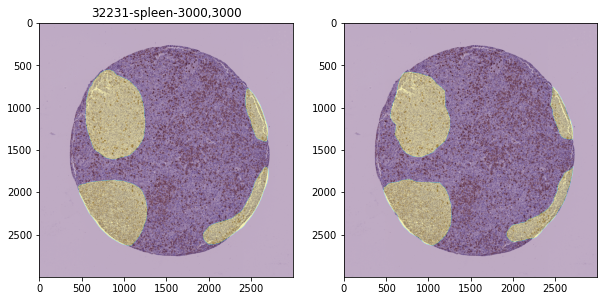

0.9542346117079147 0.9542346117079147


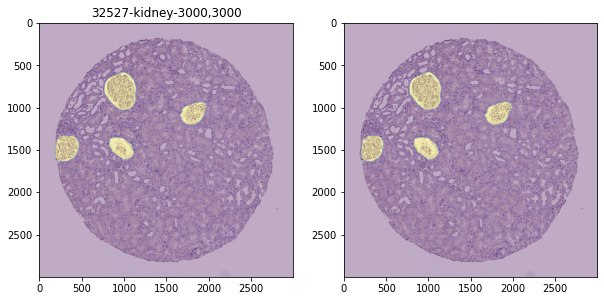

0.9759752899728126 0.9651049508403636


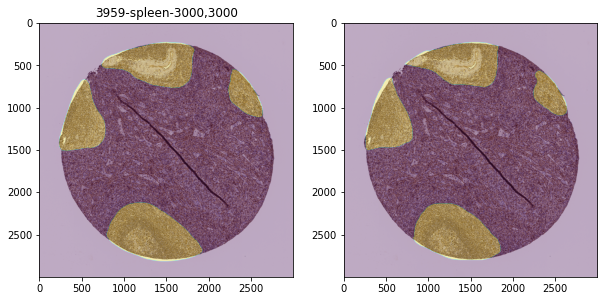

0.962392708939537 0.9642008702067547


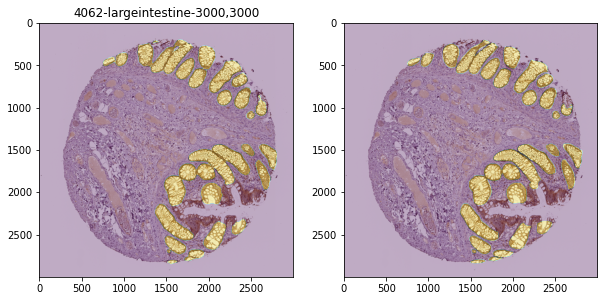

0.9448784977699992 0.9593702770975658


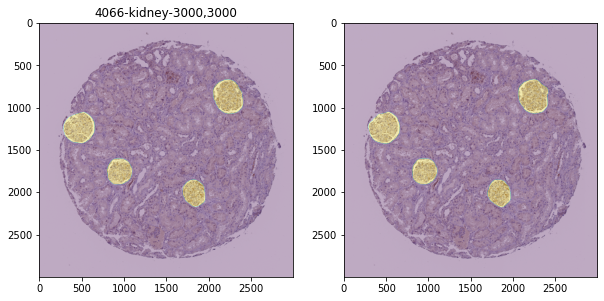

0.9787322959406071 0.963242680866174


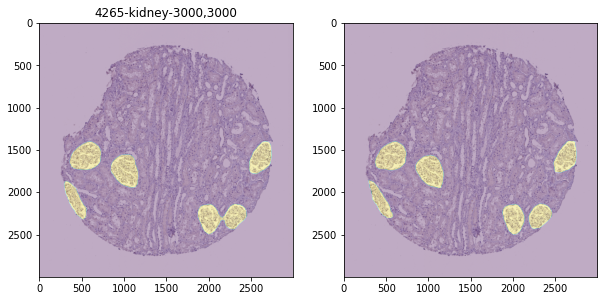

0.9647714820908576 0.963497481070288


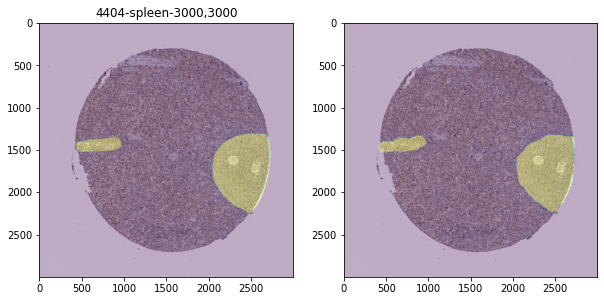

0.961431905538911 0.9632023988515198


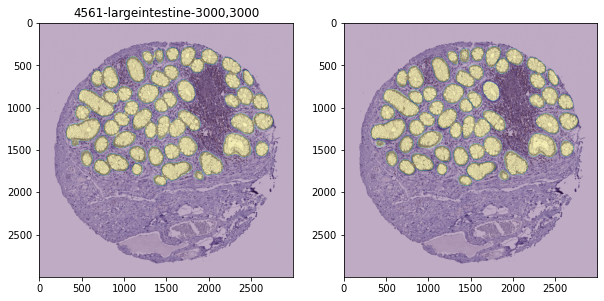

0.962049710897224 0.9630583128572329


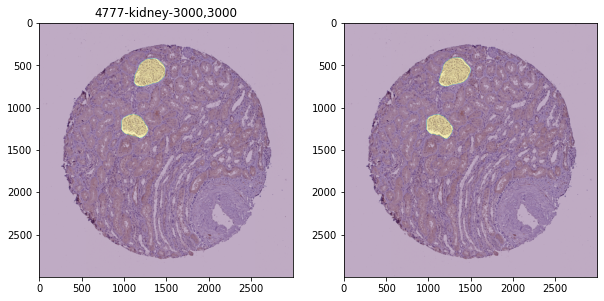

0.9699863831175758 0.9638280984417155


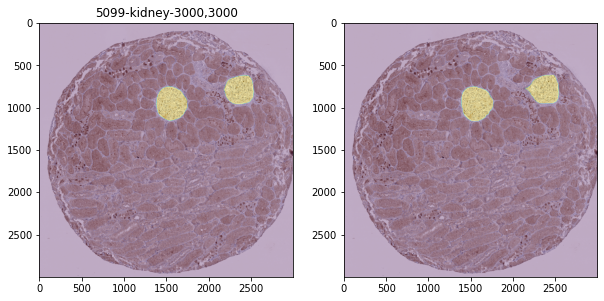

0.9647826127150531 0.9639235498690493


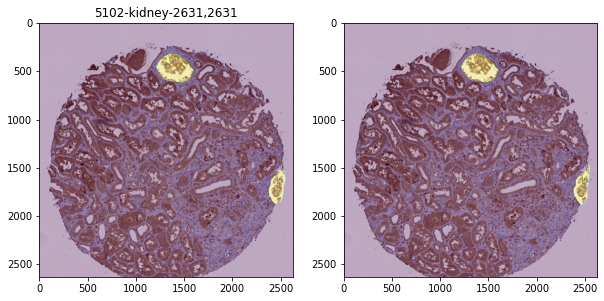

0.960157305938772 0.9635811640572058


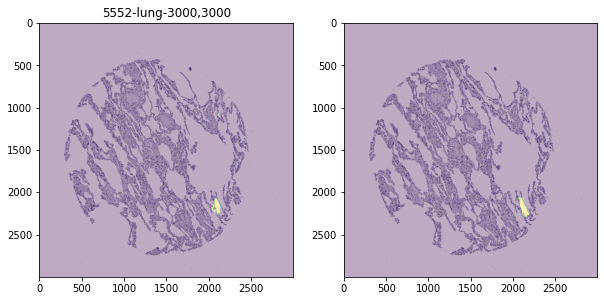

0.6328129977699904 0.9360171501999379


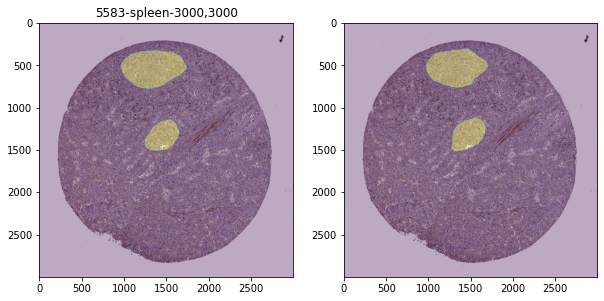

0.9314161901235584 0.9356632301940626


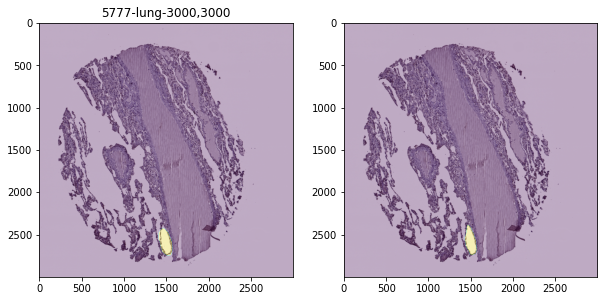

0.8837593881347757 0.9319558129041134


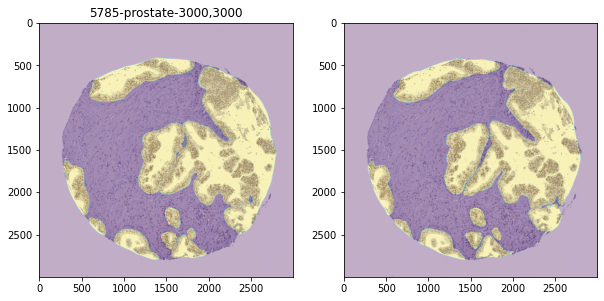

0.9653634289665838 0.9341829873082781


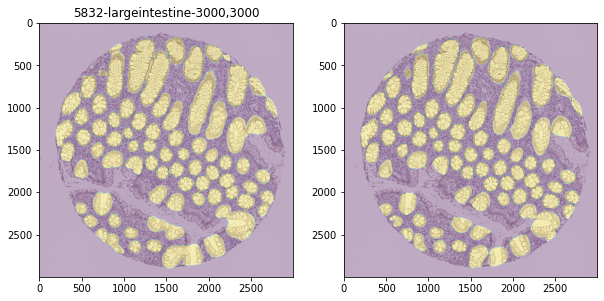

0.9485697276174356 0.9350821585776005


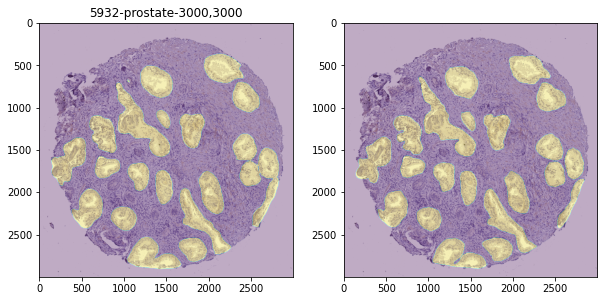

0.9366988378410133 0.9351772573578012


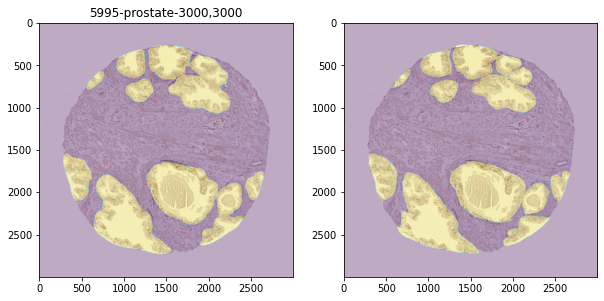

0.9569299400919185 0.9363857397319187


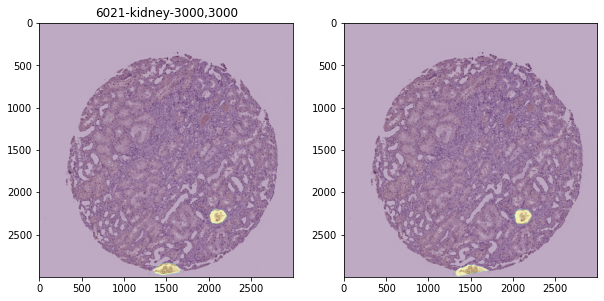

0.8720129473353921 0.9329976980268384


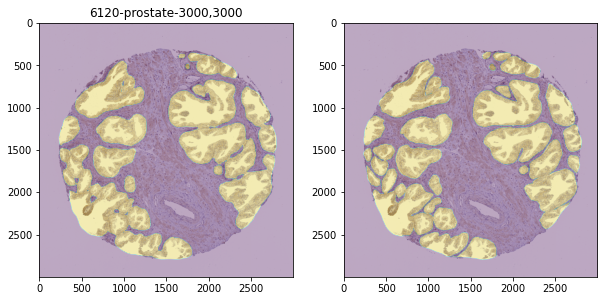

0.9501420337364344 0.9338549148123182


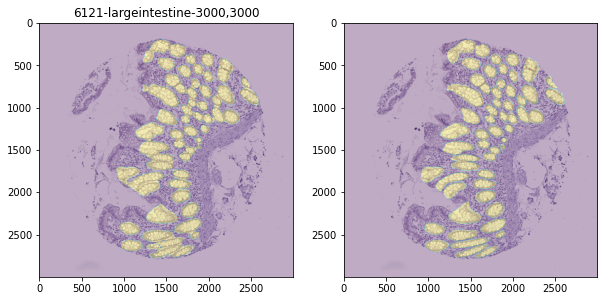

0.9282394257088261 0.9335875105692948


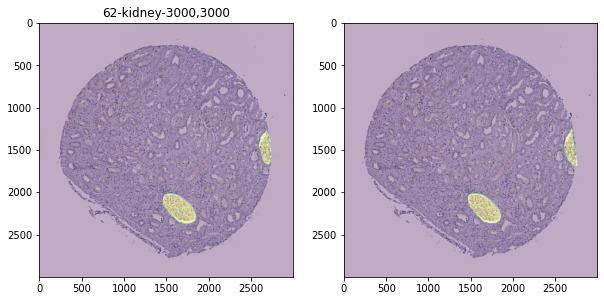

0.9491420278937864 0.9342945340840444


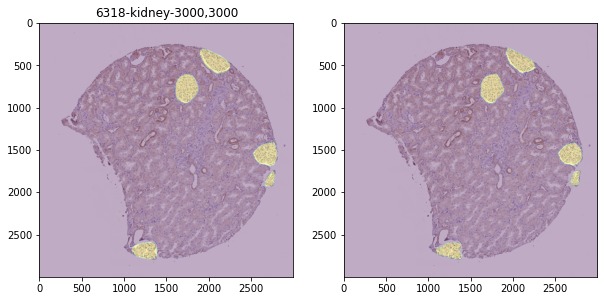

0.9450482768467455 0.9347620881172053


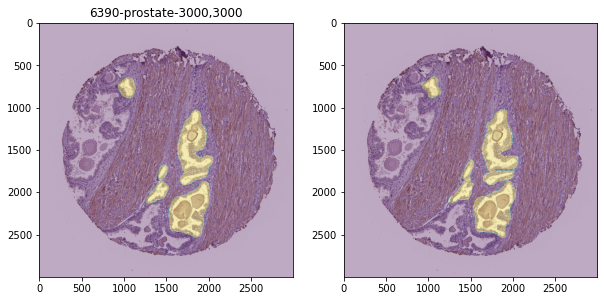

0.9415474989302638 0.9350448135677493


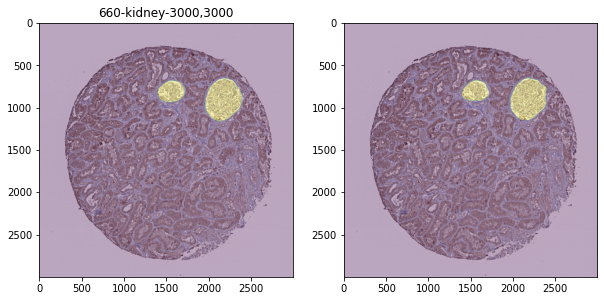

0.9628959631909079 0.9361588595526755


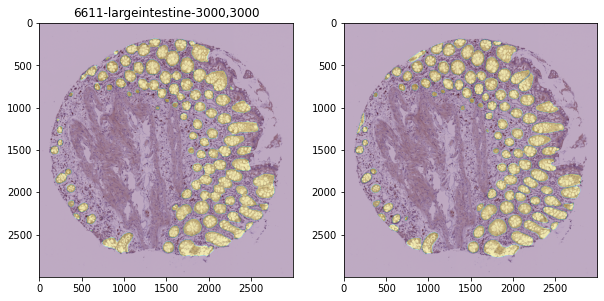

0.9239494827546932 0.9356892681373685


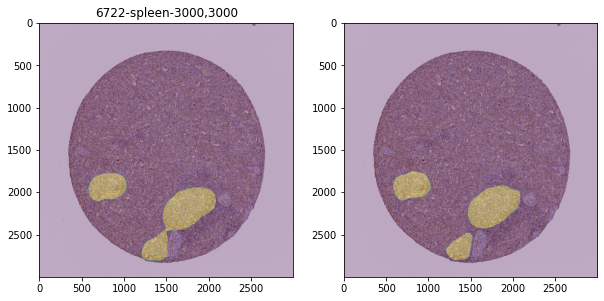

0.9372310364183286 0.9357463706662931


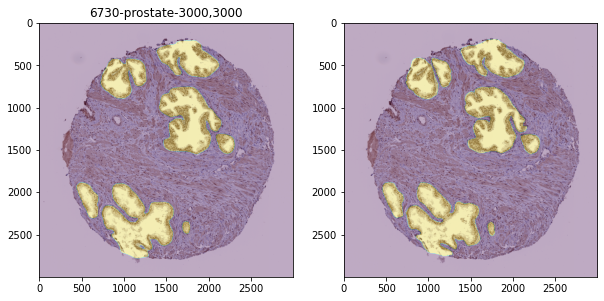

0.9558348682946879 0.9364638170101642


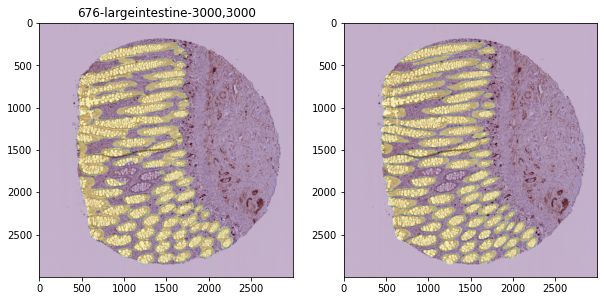

0.9080292413831839 0.9354833144023373


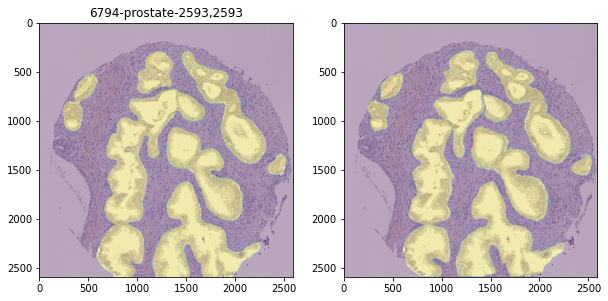

0.9620031613455443 0.9363673093004442


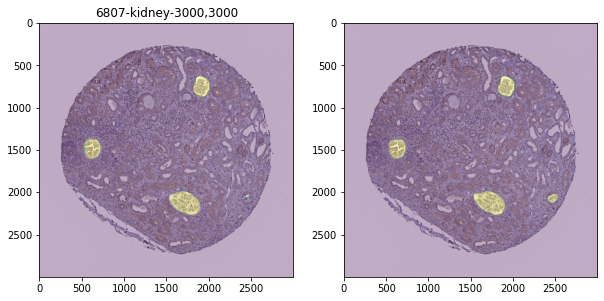

0.9419264386952617 0.9365466360551158


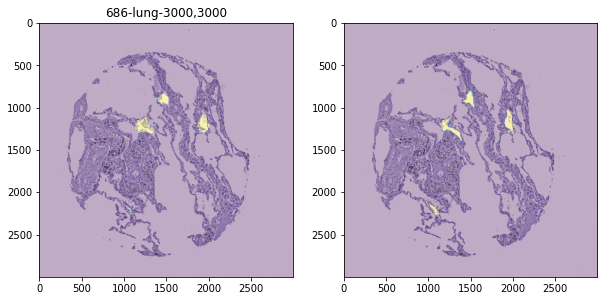

0.677673552152195 0.9284568521831496


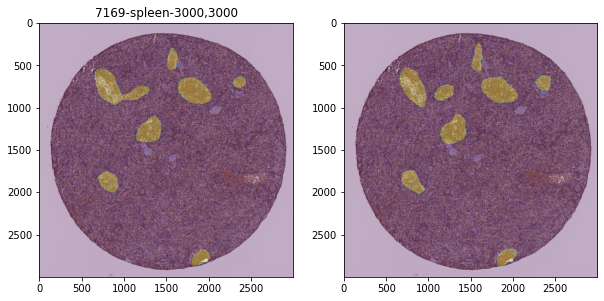

0.8989856589877578 0.9275637857226832


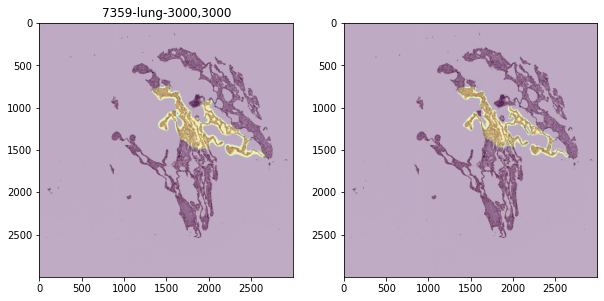

0.8989992956321349 0.9267236536611964


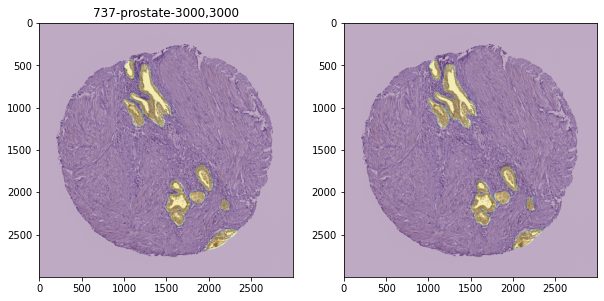

0.9302321304813056 0.9268238958560567


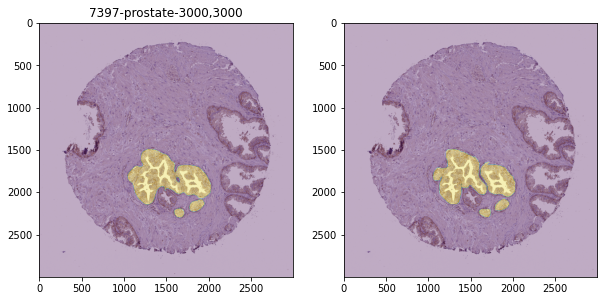

0.946904774035767 0.9273816980277153


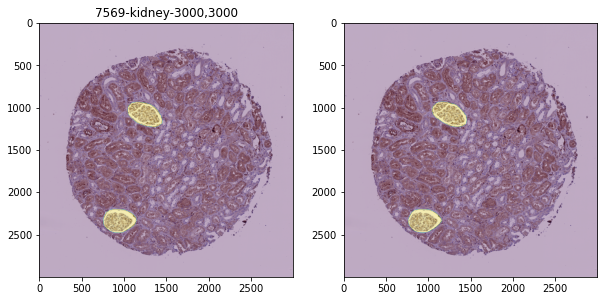

0.978921672316901 0.9287746703058014


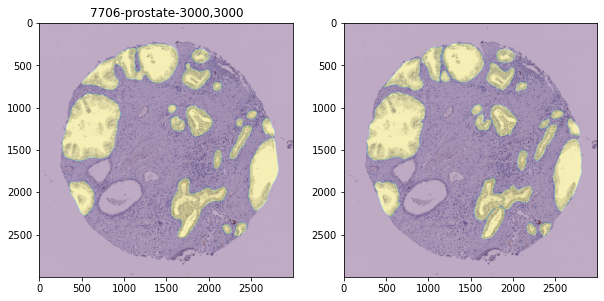

0.9479029701571517 0.929278046617679


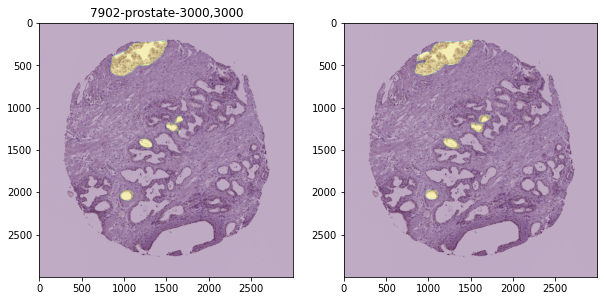

0.9219422249539029 0.9290899486263001


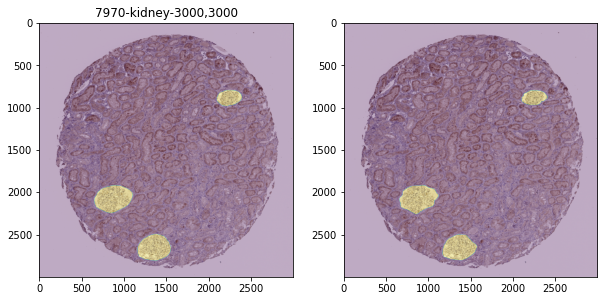

0.9658071590122878 0.9300078788859498


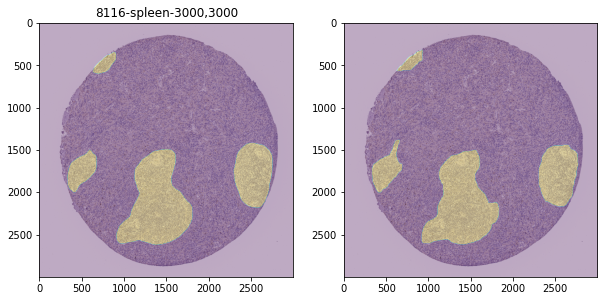

0.9574716280375863 0.9306777264262336


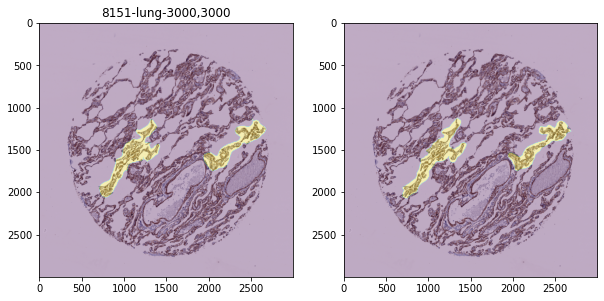

0.9080645593757936 0.9301393176869375


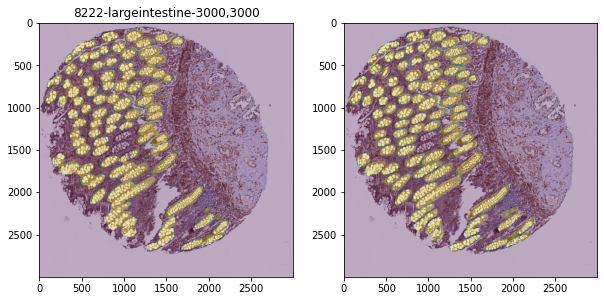

0.8899956807646742 0.929205744735257


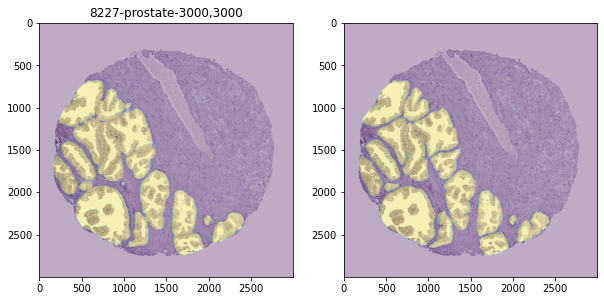

0.9602731049996451 0.9299118211049021


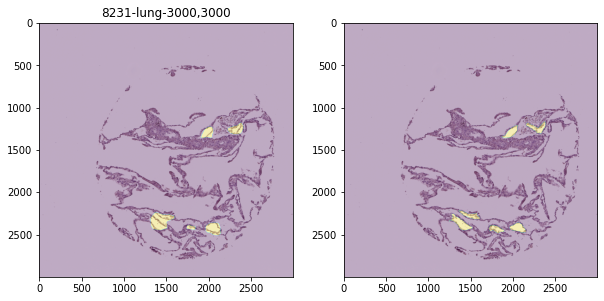

0.6836717865271074 0.9244398203365067


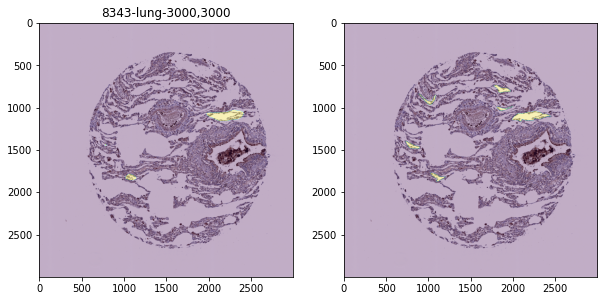

0.5896971402441169 0.9171628055518896


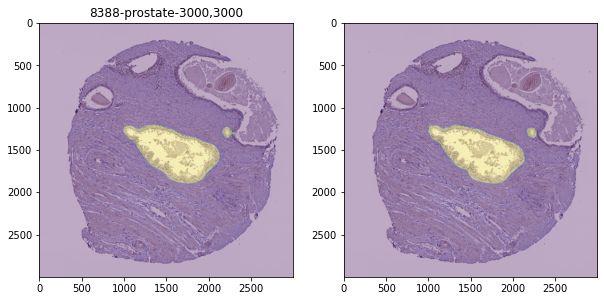

0.9817646346046813 0.9185373125530129


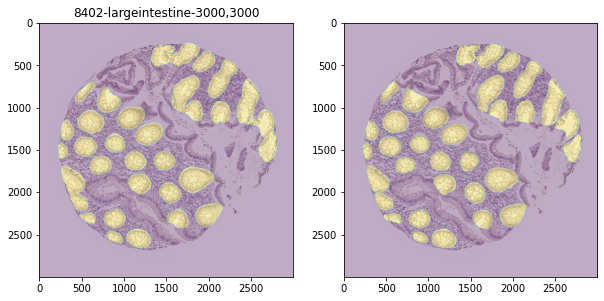

0.9489141093572709 0.9191701624864348


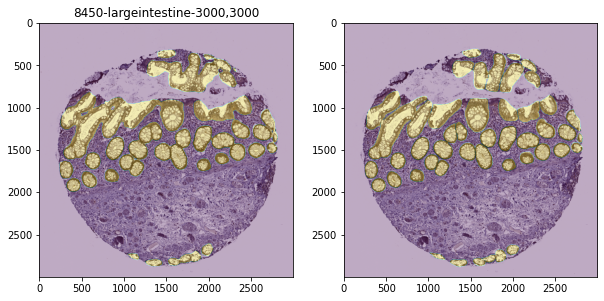

0.9521115890869074 0.9198424364986892


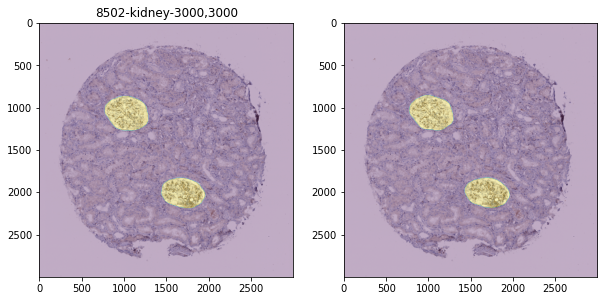

0.9762815265769683 0.9209712183002549


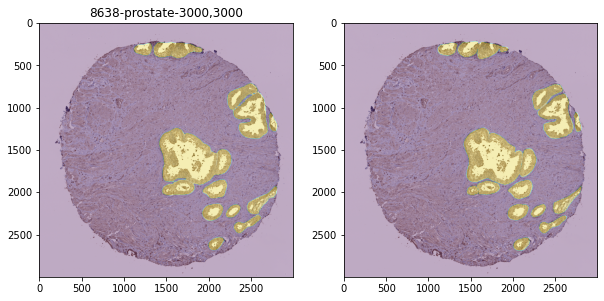

0.9552103088224762 0.9216425730163768


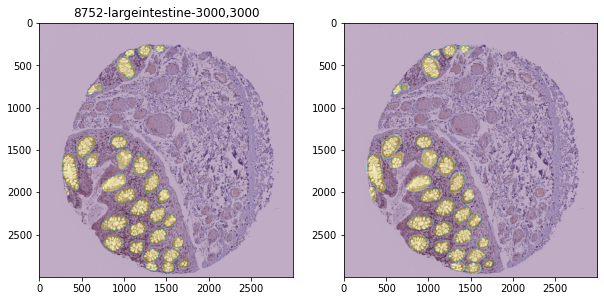

0.940534159289385 0.9220058727523962


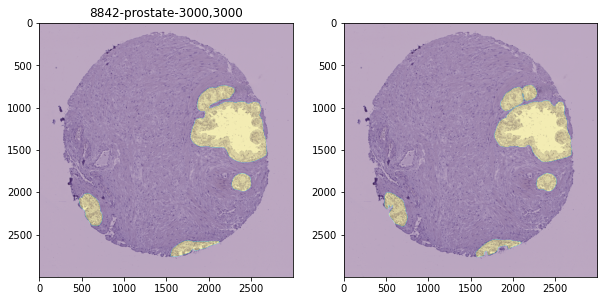

0.9554607954541452 0.9226370977090329


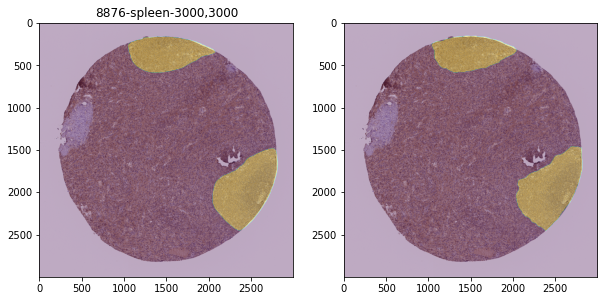

0.9710433207605965 0.9235335092470248


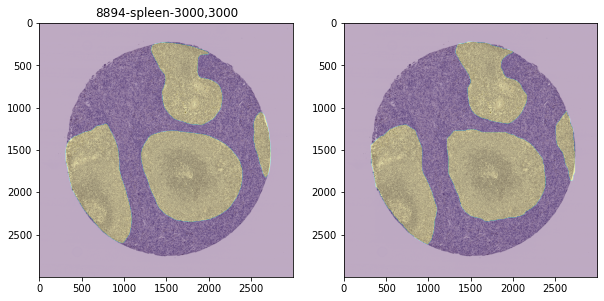

0.9690959761696103 0.9243619177365263


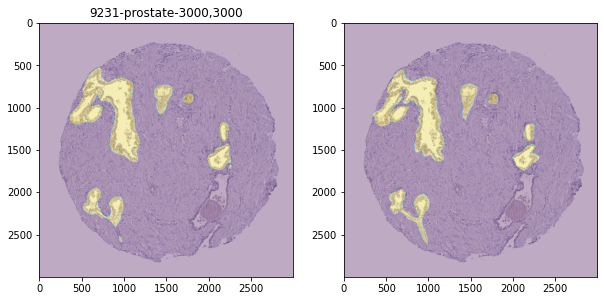

0.9173112231384924 0.9242360124758472


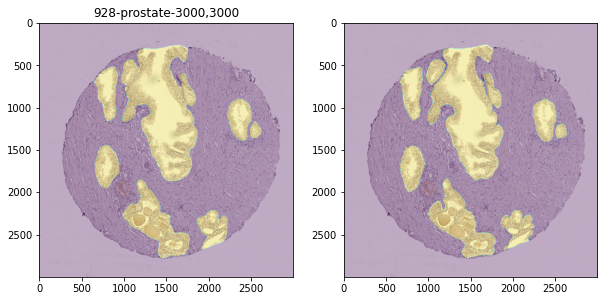

0.9580775210446946 0.9248297231524936


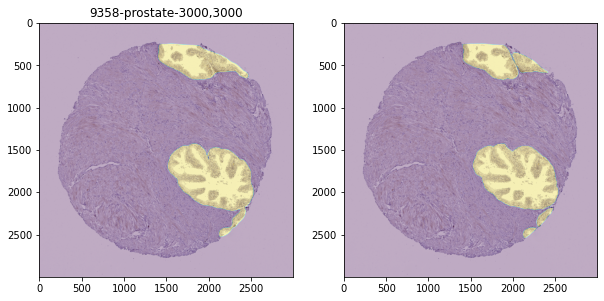

0.9662127396837376 0.925543223437515


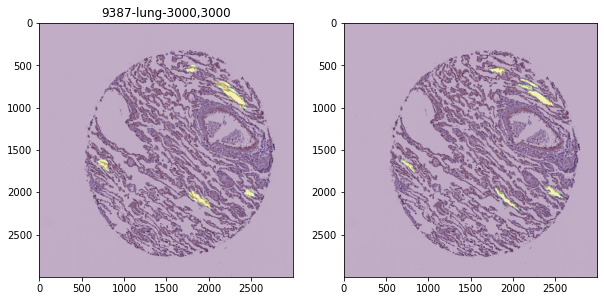

0.6541105460235846 0.9209426695830416


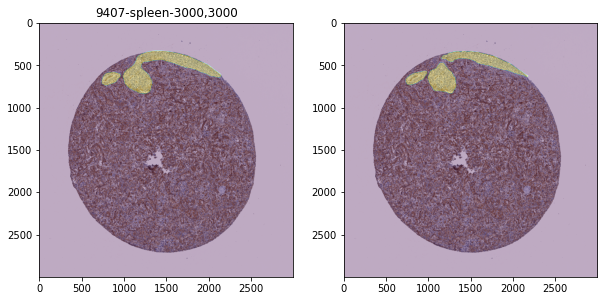

0.9195575170516421 0.9209195837075183


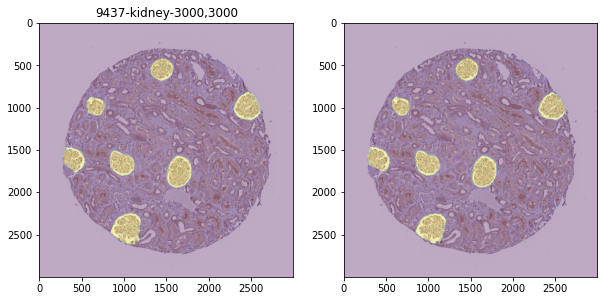

0.9711494687135993 0.9217430244453229


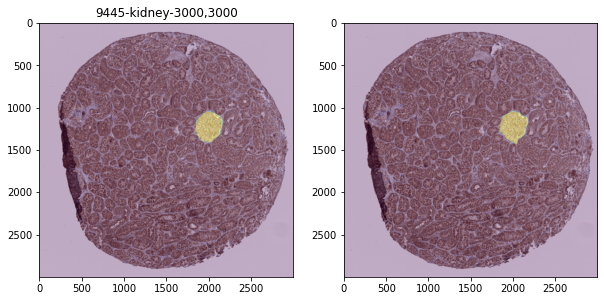

0.9573073259848836 0.92231664221209


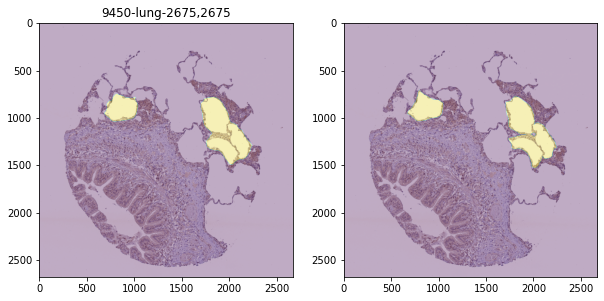

0.9453703833387023 0.9226825746109252


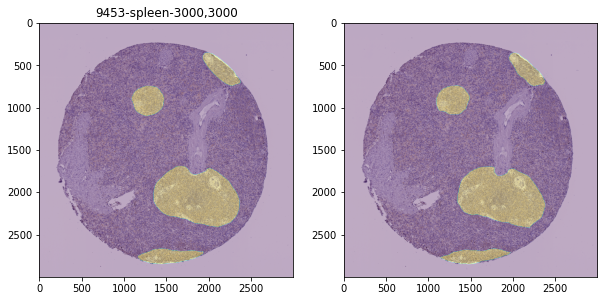

0.9609300152595797 0.9232801908710604


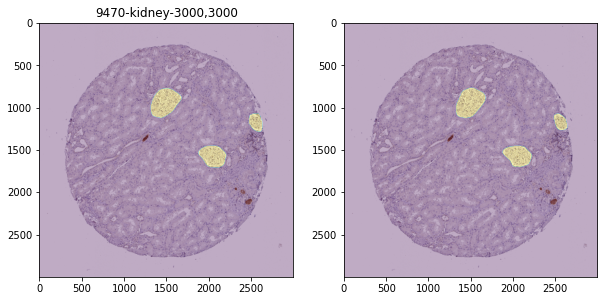

0.9586188226166122 0.9238238621286843


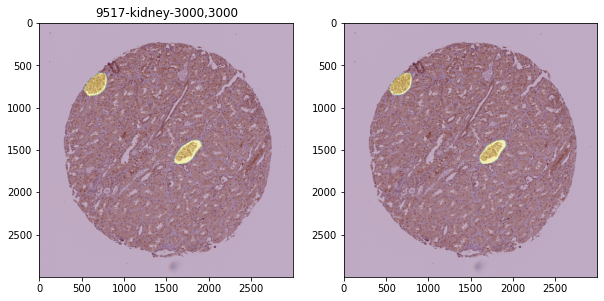

0.9604960141718335 0.9243795007960047


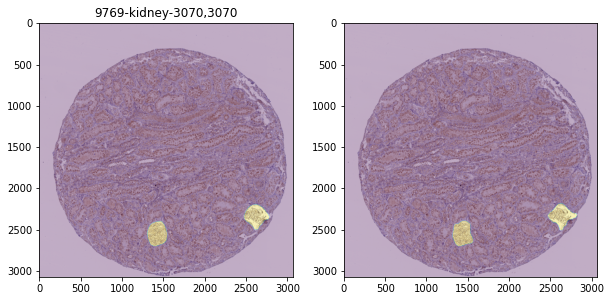

0.9381476337998077 0.9245849953184495


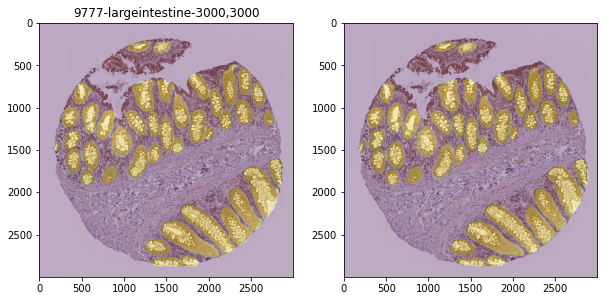

0.9581607094528304 0.9250787558204258


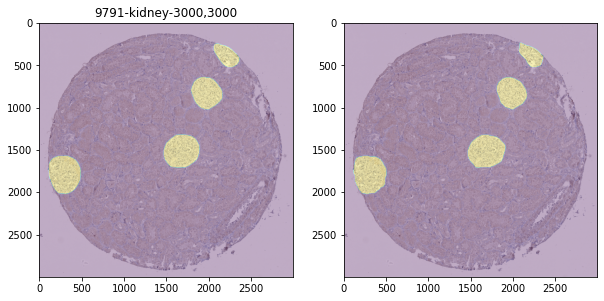

0.970265689704206 0.9257336389201907


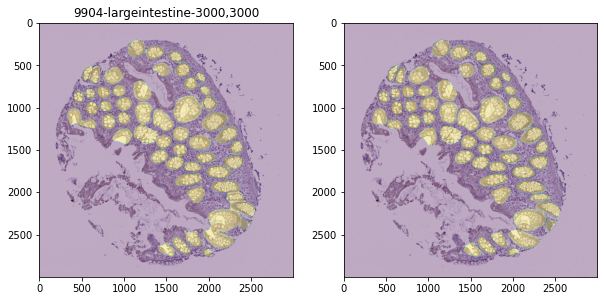

0.9417720397232884 0.9259627589316635
DICE =  0.9259627589316635


In [ ]:
from PIL import Image
from transformers import SegformerFeatureExtractor
feature_extractor = SegformerFeatureExtractor(reduce_labels=False, size=(WIDTH, HEIGHT))

# print(pixel_values.shape)
# image = Image.open('/content/hubmap/train_images/10651.tiff')
# plt.imshow(image)

model2.eval()
dice = 0.0

test_df = df[df['fold'] == FOLD].reset_index()
for i in range(len(test_df)) :
  id = test_df.id[i]
  fname = "/content/hubmap/train_images/{}.tiff".format(id)
  image = Image.open(fname)
  encoding = feature_extractor(image, return_tensors="pt")
  pixel_values = encoding.pixel_values.cuda()
  organ = test_df.organ[i]
  rle = test_df.rle[i]
  height, width = test_df.img_height[i], test_df.img_width[i]
  idx = class2idx[organ]
  with torch.no_grad():
    outputs = model2(pixel_values=pixel_values)
    upsampled_logits = nn.functional.interpolate(outputs['logits'],
                # size=image.size[::-1], # (height, width)
                (height, width),
                mode='bilinear',
                align_corners=False)
    mask = upsampled_logits.argmax(dim=1)[0]
    mask[mask != idx] = 0
    mask[mask == idx] = 1

  gt = rle2mask(rle, shape = (height, width))
  plt.figure(figsize=(10,10))
  plt.subplot(1, 2, 1)
  plt.imshow(image)
  plt.imshow(mask.cpu().numpy(), alpha=0.3)
  plt.title("{}-{}-{},{}".format(id, organ, width, height))
  plt.subplot(1, 2, 2)
  plt.imshow(image)
  plt.imshow(gt, alpha=0.3)
  plt.show()

  dice += dice_coef(mask.cpu().numpy(), gt)
  print(dice_coef(mask.cpu().numpy(), gt), dice/(i+1))

print("DICE = ", dice/len(test_df))

In [ ]:
len(test_df)

70

In [ ]:
def calc_resize(w, p) :
    a = 3000/512
    target = int((w*p/0.4)/a + 0.5)
    target = (target+31)//32 * 32
    return target

calc_resize(2023, 0.4945), calc_resize(3000, 0.4), calc_resize(160, 6.263), calc_resize(4500, 0.2290)

(448, 512, 448, 448)

In [ ]:
!pip install staintools
!pip install spams

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# 多くのカグラーは染色ツールを使用して、増強のために組織画像の色を着色しています。
# 彼らは他のより重要な側面を見逃しています：テクスチャ（すなわち形態）
import staintools

# Read data
to_augment = staintools.read_image("/content/hubmap/train_images/10044.tiff")

# Standardize brightness (optional, can improve the tissue mask calculation)
# to_augment = staintools.LuminosityStandardizer.standardize(to_augment)

# Stain augment
augmentor = staintools.StainAugmentor(method='vahadane', sigma1=0.2, sigma2=0.2)

augmentor.fit(to_augment)
augmented_images = []
for _ in range(2):
    augmented_image = augmentor.pop()
    augmented_images.append(augmented_image)

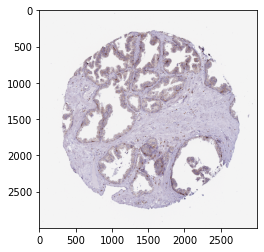

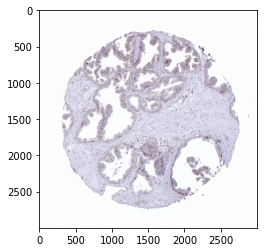

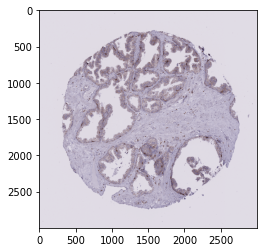

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(to_augment)
plt.show()
for e in augmented_images:
  plt.imshow(e/255)
  plt.show()